# Cell Trajectory Divergence Analysis

This notebook implements analysis for detecting when STOP trial neural trajectories diverge from GO baseline.

Here we look at singel cell and check for their seperate divergence

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.special import gammaln
import sys

# Add parent directory to path
sys.path.insert(0, str(Path.cwd().parent))

import importlib
import session_class
import cell_analysis
import multi_session_pca
importlib.reload(session_class)
importlib.reload(cell_analysis)
importlib.reload(multi_session_pca)

from session_class import Session
from cell_analysis import Cell
from multi_session_pca import MultiSessionPCA

import holoviews as hv
from holoviews import opts
from bokeh.io import output_notebook
output_notebook()
hv.extension('bokeh')

print("Imports loaded successfully!")

Loading BokehJS ...

Imports loaded successfully!


## 1. Load Data, instantiate session and populate variables 

### 1.A Variables and Parameters

In [2]:
base_path = Path.cwd().parents[1] / 'data' / 'unified_cell_trial_data'
pickle_file = base_path / 'msn_fiona_cell_trial_data.pkl'

session_id = 'fi211025a'  

dir_map = {0: 'Right', 180: 'Left'}

SSD_NUM = 2
EPOK = [-100, 350]
BIN_SIZE = 100  # Bin width in ms
BIN_STEP = 20   # Bin step size in ms (sliding windows)
FR_MIN = 1.0    # Hz
DIRECTION = 0  # Left (has more STOP trials)

### 1.B get instances

In [3]:
# Load MSN cell database
cell_df = pd.read_pickle(pickle_file)

# Select session 
session_data = cell_df[cell_df['trial_session'] == session_id]

# Create Session object
session = Session(session_data, verbose=True)
# session = Session(cell_df, verbose=True)
session.data = cell_df
session.n_cells = cell_df['cell_ID'].nunique()
session.cell_ids = sorted(session.data['cell_ID'].unique()) 


# Drop cells with missing trial type or direction data
session.drop_cells_with_missing_trial_type_or_dir_data()

print(f"\nSession {session_id} loaded successfully!")
print(f"Number of cells after filtering: {session.n_cells}")
print(f"Total cell-trial combinations: {len(session.data)}")

Session fi211025a initialized:
  - Number of cells: 150
  - Total trials: 1950
  - Trial types: ['CONT', 'GO', 'STOP']
  - Directions: [np.int64(0), np.int64(180)]
Cell 1352 removed from session fi211025a.
Cell 2134 removed from session fi211025a.
Dropped 2 cells with incomplete trial type or directional data.

Session fi211025a loaded successfully!
Number of cells after filtering: 3025
Total cell-trial combinations: 1906390


In [4]:
# leave only tunned cells in the DF
# tunned_cells =[
#     1547, 1557, 1562, 1566, 1567, 1571, 1572, 1574, 1589, 1595, 1596,
#     1599, 1605, 1550, 1554, 1559, 1568, 1594, 1600, 1602, 1579, 1556
# ]
# session.data = session.data[session.data['cell_ID'].isin(tunned_cells)]
# session.n_cells = session.data['cell_ID'].nunique()
# print(f"Number of tunned cells in session: {session.n_cells}")

In [5]:
# # Load synthetic session data
# session_id = 'synthetic_session'
# synthetic_pickle_file = base_path / 'synthetic_session_data.pkl'
# synthetic_df =pd.read_pickle(synthetic_pickle_file)
# session = Session(synthetic_df, verbose=True)

### 1.C Clean data
Remove GO trials with reaction time greater than mean SSD length (pluse maybe a buffer)

In [6]:
session.data.columns

Index(['cell_ID', 'cell_type', 'maestro_ID', 'problem', 'grade', 'filename',
       'trial_name', 'reaction_time', 'go_cue', 'stop_cue', 'trial_failed',
       'ssd_len', 'ssd_number', 'type', 'first_relevant_saccade',
       'segs_durations', 'segs_times', 'trial_length', 'screen_rotation',
       'saccades', 'blinks', 'dir', 'neural_data', 'session', 'plexon_session',
       'trial_number', 'trial_session'],
      dtype='object')

In [7]:
def is_go_trial_with_valid_saccade(row, mean_ssd):
    if (row['type'] != 'GO'):
        return True
    if np.isnan(row['first_relevant_saccade']).any():
        return False
    saccade_onset = row['first_relevant_saccade'][0]
    return (saccade_onset - row['go_cue']) > (mean_ssd * 1.5)

oring_data = session.data.copy()
print(oring_data.shape)

stop_trials = session.data[
    (session.data['type'] == 'STOP') & 
    (session.data['trial_failed'] == False) & 
    (session.data['dir'] == DIRECTION) &
    (session.data['ssd_number'] == SSD_NUM)
]
mean_ssd = stop_trials['ssd_len'].mean()
print(f"Mean SSD length for successful STOP SSD{SSD_NUM} trials: {mean_ssd:.2f} ms")

# session.data[
#     ~session.data.apply(lambda row: is_go_trial_with_valid_saccade(row, mean_ssd), axis=1)
# ]["trial_number"].value_counts().shape

# Filter GO trials
session.data = session.data[
    session.data.apply(lambda row: is_go_trial_with_valid_saccade(row, mean_ssd), axis=1)
]

print(f"Number of removed trials after GO trial filtering: {oring_data.shape[0] - session.data.shape[0]}")

(1906390, 27)
Mean SSD length for successful STOP SSD2 trials: 109.22 ms
Number of removed trials after GO trial filtering: 284581


## 2. Check Trial Counts

Verify we have enough GO and STOP SSD2 trials for each direction.

In [8]:
# Count successful trials for GO and STOP SSD2 by direction

results = []
for dir in [0, 180]:
    dir_name = dir_map[dir]
    
    # GO trials (successful only) - count unique trial numbers
    go_count = len(session.data[
        (session.data['type'] == 'GO') & 
        (session.data['dir'] == dir) &
        (session.data['trial_failed'] == False)
    ].drop_duplicates(subset=['trial_number']))
    results.append({'Direction': dir_name, 'Type': 'GO', 'Trial Count': go_count})
    
    # STOP SSD2 trials (successful only)
    stop_count = len(session.data[
        (session.data['type'] == 'STOP') & 
        (session.data['dir'] == dir) & 
        (session.data['ssd_number'] == SSD_NUM) &
        (session.data['trial_failed'] == False)
    ].drop_duplicates(subset=['trial_number']))
    results.append({'Direction': dir_name, 'Type': 'STOP SSD2', 'Trial Count': stop_count})

results_df = pd.DataFrame(results)
print("\nSuccessful Trial Counts:")
print("=" * 40)
print(results_df.to_string(index=False))


Successful Trial Counts:
Direction      Type  Trial Count
    Right        GO         2332
    Right STOP SSD2         1108
     Left        GO         2318
     Left STOP SSD2         1017


## 3. Create Trial Number Lists

Extract unique trial numbers for GO and STOP trials by direction.

In [9]:
def filter_trials(session_data, trial_type, direction, ssd_number=None, success_only=True, cell_id=None):
    """
    Filter trials based on specified conditions.
    
    Parameters:
    -----------
    session_data : DataFrame
        Session data containing trial information
    trial_type : str
        'GO', 'STOP', or 'CONT'
    direction : int
        0 (right) or 180 (left)
    ssd_number : float, optional
        SSD level (1.0-4.0) for STOP/CONT trials
    success_only : bool
        If True, only include trials where trial_failed == False
    cell_id : int or str, optional
        Cell ID to filter by. If None, includes all cells
    
    Returns:
    --------
    DataFrame : Filtered session data
    """
    # Base filter
    mask = (session_data['type'] == trial_type) & (session_data['dir'] == direction)
    
    # Add success filter if requested
    if success_only:
        mask &= (session_data['trial_failed'] == False)
    
    # Add SSD filter if specified
    if ssd_number is not None:
        mask &= (session_data['ssd_number'] == ssd_number)
    
    # Add cell_id filter if specified
    if cell_id is not None:
        mask &= (session_data['cell_ID'] == cell_id)
    
    return session_data[mask]


def get_trial_numbers(session_data, trial_type, direction, ssd_number=None, success_only=True):
    """
    Extract unique trial numbers for specified conditions.
    
    Parameters:
    -----------
    session_data : DataFrame
        Session data containing trial information
    trial_type : str
        'GO', 'STOP', or 'CONT'
    direction : int
        0 (right) or 180 (left)
    ssd_number : float, optional
        SSD level (1.0-4.0) for STOP/CONT trials
    success_only : bool
        If True, only include trials where trial_failed == False
    
    Returns:
    --------
    list : Sorted list of unique trial numbers
    """
    filtered_data = filter_trials(session_data, trial_type, direction, ssd_number, success_only)
    return sorted(filtered_data['trial_number'].unique())


# Create trial lists for GO and STOP trials
trial_lists = {}

for dir, dir_name in dir_map.items():
    # GO trials
    trial_lists[f'go_{dir_name.lower()}'] = get_trial_numbers(
        session.data, 'GO', dir
    )
    
    # STOP trials with specified SSD
    trial_lists[f'stop_{dir_name.lower()}'] = get_trial_numbers(
        session.data, 'STOP', dir, ssd_number=SSD_NUM
    )

# Extract to individual variables for convenience
go_right_trials = trial_lists['go_right']
go_left_trials = trial_lists['go_left']
stop_right_trials = trial_lists['stop_right']
stop_left_trials = trial_lists['stop_left']

# Display results
print("Trial Number Lists:")
print("=" * 60)
print(f"\nGO Right (n={len(go_right_trials)}):")
print(f"\nGO Left (n={len(go_left_trials)}):")
print(f"\nSTOP SSD{SSD_NUM} Right (n={len(stop_right_trials)}):")
print(f"\nSTOP SSD{SSD_NUM} Left (n={len(stop_left_trials)}):")

Trial Number Lists:

GO Right (n=2332):

GO Left (n=2318):

STOP SSD2 Right (n=1108):

STOP SSD2 Left (n=1017):


## 4. Neuron Distribution per Trial

Analyze how many neurons are recorded for each trial.

Right STOP SSD2 Trials - Neurons per Trial Distribution:
Total trials: 1108
Mean neurons per trial: 35.67
Median neurons per trial: 30
Min neurons per trial: 1
Max neurons per trial: 182

Distribution:
cell_ID
1      24
2       6
3       4
4       8
5       8
       ..
152     1
164     2
167     1
171     1
182     1
Name: count, Length: 121, dtype: int64


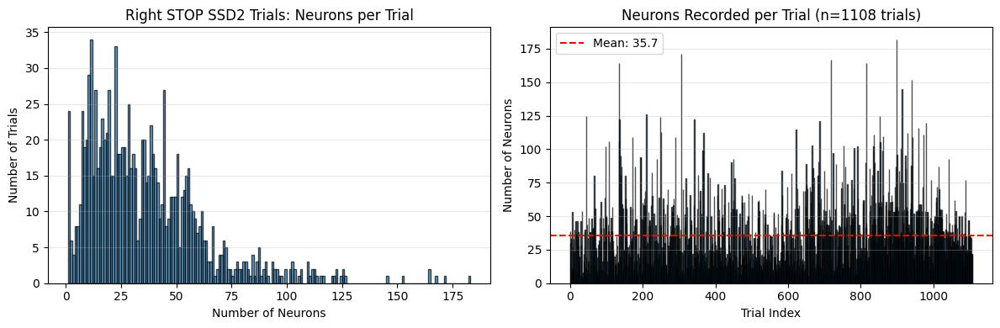



Trial-by-trial breakdown:
Trial 87: 30 neurons
Trial 89: 39 neurons
Trial 91: 34 neurons
Trial 93: 33 neurons
Trial 94: 11 neurons
Trial 95: 10 neurons
Trial 101: 53 neurons
Trial 102: 9 neurons
Trial 106: 27 neurons
Trial 107: 11 neurons
Trial 108: 33 neurons
Trial 110: 23 neurons
Trial 111: 40 neurons
Trial 114: 9 neurons
Trial 115: 25 neurons
Trial 116: 46 neurons
Trial 117: 37 neurons
Trial 118: 7 neurons
Trial 119: 7 neurons
Trial 120: 37 neurons
Trial 121: 46 neurons
Trial 124: 33 neurons
Trial 125: 38 neurons
Trial 126: 10 neurons
Trial 127: 28 neurons
Trial 128: 20 neurons
Trial 129: 19 neurons
Trial 131: 5 neurons
Trial 132: 1 neurons
Trial 133: 46 neurons
Trial 134: 29 neurons
Trial 135: 5 neurons
Trial 136: 7 neurons
Trial 138: 54 neurons
Trial 139: 1 neurons
Trial 141: 4 neurons
Trial 142: 8 neurons
Trial 143: 22 neurons
Trial 144: 17 neurons
Trial 145: 27 neurons
Trial 146: 39 neurons
Trial 147: 40 neurons
Trial 151: 12 neurons
Trial 152: 4 neurons
Trial 153: 125 neurons

In [10]:
# Parameters for analysis
analysis_trial_type = 'STOP'
analysis_direction = DIRECTION
analysis_ssd_num = SSD_NUM

# Filter trials using the filter function
filtered_data = filter_trials(
    session.data, 
    trial_type=analysis_trial_type, 
    direction=analysis_direction, 
    ssd_number=analysis_ssd_num,
    success_only=True
)

# Count unique cells per trial
neurons_per_trial = filtered_data.groupby('trial_number')['cell_ID'].nunique().sort_index()

# Summary statistics
dir_name = dir_map[analysis_direction]
print(f"{dir_name} {analysis_trial_type} SSD{analysis_ssd_num} Trials - Neurons per Trial Distribution:")
print("=" * 60)
print(f"Total trials: {len(neurons_per_trial)}")
print(f"Mean neurons per trial: {neurons_per_trial.mean():.2f}")
print(f"Median neurons per trial: {neurons_per_trial.median():.0f}")
print(f"Min neurons per trial: {neurons_per_trial.min()}")
print(f"Max neurons per trial: {neurons_per_trial.max()}")
print(f"\nDistribution:")
print(neurons_per_trial.value_counts().sort_index())

# Visualize distribution
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))

# Histogram
ax1.hist(neurons_per_trial, bins=range(neurons_per_trial.min(), neurons_per_trial.max() + 2), 
         edgecolor='black', alpha=0.7)
ax1.set_xlabel('Number of Neurons')
ax1.set_ylabel('Number of Trials')
ax1.set_title(f'{dir_name} {analysis_trial_type} SSD{analysis_ssd_num} Trials: Neurons per Trial')
ax1.grid(axis='y', alpha=0.3)

# Per-trial view
ax2.bar(range(len(neurons_per_trial)), neurons_per_trial.values, edgecolor='black', alpha=0.7)
ax2.set_xlabel('Trial Index')
ax2.set_ylabel('Number of Neurons')
ax2.set_title(f'Neurons Recorded per Trial (n={len(neurons_per_trial)} trials)')
ax2.axhline(y=neurons_per_trial.mean(), color='r', linestyle='--', label=f'Mean: {neurons_per_trial.mean():.1f}')
ax2.legend()
ax2.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

# Show trial-by-trial details
print(f"\n\nTrial-by-trial breakdown:")
print("=" * 60)
for trial_num, n_neurons in neurons_per_trial.items():
    print(f"Trial {trial_num}: {n_neurons} neurons")

## 5. Filter Neurons by STOP Trial Count

For the random sampling approach, we need neurons with sufficient STOP trials.
Filter to keep only neurons with at least 5 STOP trials in the specified direction.

In [11]:
# Minimum STOP trials required per neuron
MIN_STOP_TRIALS = 5

# Filter STOP trials for the specified direction and SSD
stop_trial_data = filter_trials(
    session.data,
    trial_type='STOP',
    direction=DIRECTION,
    ssd_number=SSD_NUM,
    success_only=True
)

# Count STOP trials per neuron
stop_trials_per_neuron = stop_trial_data.groupby('cell_ID')['trial_number'].nunique()

# Filter neurons with sufficient STOP trials
valid_neurons = stop_trials_per_neuron[stop_trials_per_neuron >= MIN_STOP_TRIALS].index.tolist()

print(f"Neuron Filtering Results (Direction: {dir_map[DIRECTION]}, SSD{SSD_NUM}):")
print("=" * 60)
print(f"Total neurons in session: {session.n_cells}")
print(f"Neurons with >= {MIN_STOP_TRIALS} STOP trials: {len(valid_neurons)}")
print(f"Neurons filtered out: {session.n_cells - len(valid_neurons)}")
print(f"\nSTOP trials per neuron distribution:")
print(stop_trials_per_neuron.value_counts().sort_index())

# Display which neurons passed the filter
print(f"\n\nValid neuron IDs (n={len(valid_neurons)}):")
print(valid_neurons)

# Show statistics for valid neurons
if len(valid_neurons) > 0:
    valid_stop_counts = stop_trials_per_neuron[valid_neurons]
    print(f"\n\nValid neurons - STOP trial statistics:")
    print("=" * 60)
    print(f"Mean STOP trials: {valid_stop_counts.mean():.2f}")
    print(f"Median STOP trials: {valid_stop_counts.median():.0f}")
    print(f"Min STOP trials: {valid_stop_counts.min()}")
    print(f"Max STOP trials: {valid_stop_counts.max()}")

Neuron Filtering Results (Direction: Right, SSD2):
Total neurons in session: 3025
Neurons with >= 5 STOP trials: 2773
Neurons filtered out: 252

STOP trials per neuron distribution:
trial_number
1      18
2      27
3      70
4      98
5     101
6     143
7     148
8     211
9     159
10    196
11    223
12    159
13    157
14    130
15    151
16    176
17    171
18     91
19     98
20     49
21     49
22     40
23     26
24     56
25     73
26     36
27     20
28     21
29      8
30      6
31     16
32     29
33      1
36      1
37     28
Name: count, dtype: int64


Valid neuron IDs (n=2773):
[3, 7, 8, 11, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 26, 28, 29, 31, 32, 35, 40, 41, 43, 46, 48, 50, 51, 52, 53, 54, 55, 57, 58, 59, 61, 63, 64, 66, 67, 70, 72, 74, 76, 77, 78, 81, 82, 84, 86, 88, 93, 99, 103, 105, 107, 114, 117, 121, 129, 131, 142, 146, 148, 149, 152, 159, 160, 162, 165, 168, 169, 170, 171, 172, 173, 175, 178, 179, 181, 182, 183, 184, 185, 187, 188, 190, 191, 193, 194, 198, 199,

In [12]:
# Also check GO trial counts for valid neurons
go_trial_data = filter_trials(
    session.data,
    trial_type='GO',
    direction=DIRECTION,
    success_only=True
)

# Count GO trials for valid neurons only
go_trials_per_neuron = go_trial_data.groupby('cell_ID')['trial_number'].nunique()
valid_go_counts = go_trials_per_neuron[valid_neurons]

print(f"GO trial counts for valid neurons (Direction: {dir_map[DIRECTION]}):")
print("=" * 60)
print(f"Mean GO trials: {valid_go_counts.mean():.2f}")
print(f"Median GO trials: {valid_go_counts.median():.0f}")
print(f"Min GO trials: {valid_go_counts.min()}")
print(f"Max GO trials: {valid_go_counts.max()}")

# Create summary dataframe
neuron_trial_summary = pd.DataFrame({
    'cell_ID': valid_neurons,
    'n_GO_trials': [go_trials_per_neuron.get(cell_id, 0) for cell_id in valid_neurons],
    'n_STOP_trials': [stop_trials_per_neuron.get(cell_id, 0) for cell_id in valid_neurons]
})

print(f"\n\nPer-neuron trial counts:")
print("=" * 60)
print(neuron_trial_summary.to_string(index=False))

GO trial counts for valid neurons (Direction: Right):
Mean GO trials: 141.64
Median GO trials: 130
Min GO trials: 22
Max GO trials: 327


Per-neuron trial counts:
 cell_ID  n_GO_trials  n_STOP_trials
       3          198             15
       7          139             13
       8          198             15
      11           97             13
      15           97             13
      16           97             13
      17           97             13
      18           97             13
      19           97             13
      20           97             13
      21           97             13
      23           64              6
      24           97             13
      25           42             10
      26           36              8
      28           36              8
      29           97             13
      31           67             11
      32           79             10
      35           62             11
      40          130             20
      41          117  

## 6. Visualize Single Neuron Spike Data

Randomly sample one GO trial and one STOP trial for cell 1614 and visualize spike times.

In [13]:
# Select a specific neuron to visualize
example_cell_id = 1614
example_cell_id = 1547
# example_cell_id = 1541
# example_cell_id = 1 # Synthetic neuron
# Filter data for this neuron
cell_data = session.data[session.data['cell_ID'] == example_cell_id]

# Get GO trials for this neuron
go_trials = filter_trials(
    cell_data,
    trial_type='GO',
    direction=DIRECTION,
    success_only=True
)

# Get STOP trials for this neuron
stop_trials = filter_trials(
    cell_data,
    trial_type='STOP',
    direction=DIRECTION,
    ssd_number=SSD_NUM,
    success_only=True
)

print(f"Cell {example_cell_id} - {dir_map[DIRECTION]} direction:")
print("=" * 60)
print(f"Available GO trials: {len(go_trials)} (unique: {go_trials['trial_number'].nunique()})")
print(f"Available STOP SSD{SSD_NUM} trials: {len(stop_trials)} (unique: {stop_trials['trial_number'].nunique()})")

# Check if neuron has enough data
if len(go_trials) == 0 or len(stop_trials) == 0:
    print(f"\nWARNING: Cell {example_cell_id} does not have both GO and STOP trials!")
else:
    # Randomly select one trial from each condition
    np.random.seed(42)  # For reproducibility
    
    # Get unique trial numbers
    go_trial_numbers = go_trials['trial_number'].unique()
    stop_trial_numbers = stop_trials['trial_number'].unique()
    
    # Randomly select one trial number from each
    selected_go_trial_num = np.random.choice(go_trial_numbers)
    selected_stop_trial_num = np.random.choice(stop_trial_numbers)
    
    # Get the actual trial data
    selected_go = go_trials[go_trials['trial_number'] == selected_go_trial_num].iloc[0]
    selected_stop = stop_trials[stop_trials['trial_number'] == selected_stop_trial_num].iloc[0]
    
    print(f"\nRandomly selected trials:")
    print(f"GO trial number: {selected_go_trial_num}")
    print(f"STOP trial number: {selected_stop_trial_num}")
    
    # Extract spike times relative to go_cue
    go_spikes = selected_go['neural_data'] - selected_go['go_cue']
    stop_spikes = selected_stop['neural_data'] - selected_stop['go_cue']
    
    # Filter spikes within the epoch
    go_spikes_in_epoch = go_spikes[(go_spikes >= EPOK[0]) & (go_spikes <= EPOK[1])]
    stop_spikes_in_epoch = stop_spikes[(stop_spikes >= EPOK[0]) & (stop_spikes <= EPOK[1])]
    
    print(f"\nSpike counts in epoch {EPOK}:")
    print(f"GO trial: {len(go_spikes_in_epoch)} spikes")
    print(f"STOP trial: {len(stop_spikes_in_epoch)} spikes")
    
    # Store for next cell
    selected_trials = {
        'go': selected_go,
        'stop': selected_stop,
        'go_trial_num': selected_go_trial_num,
        'stop_trial_num': selected_stop_trial_num,
        'go_spikes': go_spikes_in_epoch,
        'stop_spikes': stop_spikes_in_epoch
    }

Cell 1547 - Right direction:
Available GO trials: 142 (unique: 142)
Available STOP SSD2 trials: 13 (unique: 13)

Randomly selected trials:
GO trial number: 615
STOP trial number: 388

Spike counts in epoch [-100, 350]:
GO trial: 0 spikes
STOP trial: 1 spikes


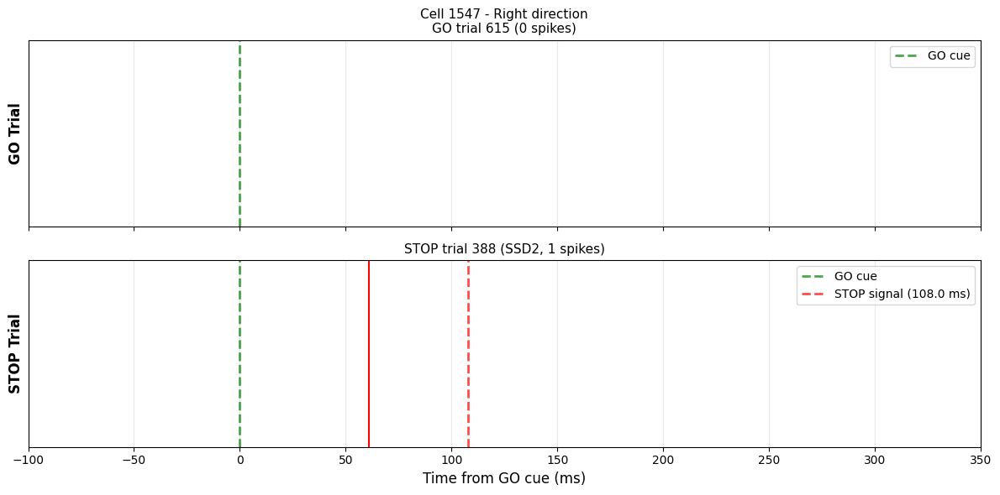


Trial timing information:
GO trial 615:
  Saccade onset: 267.0 ms after GO cue
  Reaction time: 267.0 ms

STOP trial 388:
  Stop signal delay (SSD): 108.0 ms
  SSD length: 108.0 ms
  Successfully inhibited: True


In [14]:
# Plot spike rasters for both trials
fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

# GO trial
ax_go = axes[0]
ax_go.eventplot(selected_trials['go_spikes'], colors='blue', linewidths=1.5)
ax_go.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue', alpha=0.7)
ax_go.set_ylabel('GO Trial', fontsize=12, fontweight='bold')
ax_go.set_title(f"Cell {example_cell_id} - {dir_map[DIRECTION]} direction\nGO trial {selected_trials['go_trial_num']} ({len(selected_trials['go_spikes'])} spikes)", 
                fontsize=11)
ax_go.set_ylim(0.5, 1.5)
ax_go.set_yticks([])
ax_go.legend(loc='upper right')
ax_go.grid(axis='x', alpha=0.3)
ax_go.set_xlim(EPOK)

# STOP trial
ax_stop = axes[1]
ax_stop.eventplot(selected_trials['stop_spikes'], colors='red', linewidths=1.5)
ax_stop.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue', alpha=0.7)

# Add stop signal marker if available
stop_signal_time = selected_trials['stop']['stop_cue'] - selected_trials['stop']['go_cue']
if not np.isnan(stop_signal_time):
    ax_stop.axvline(stop_signal_time, color='red', linestyle='--', linewidth=2, 
                    label=f'STOP signal ({stop_signal_time:.1f} ms)', alpha=0.7)

ax_stop.set_ylabel('STOP Trial', fontsize=12, fontweight='bold')
ax_stop.set_title(f"STOP trial {selected_trials['stop_trial_num']} (SSD{SSD_NUM}, {len(selected_trials['stop_spikes'])} spikes)", 
                  fontsize=11)
ax_stop.set_ylim(0.5, 1.5)
ax_stop.set_yticks([])
ax_stop.set_xlabel('Time from GO cue (ms)', fontsize=12)
ax_stop.legend(loc='upper right')
ax_stop.grid(axis='x', alpha=0.3)
ax_stop.set_xlim(EPOK)

plt.tight_layout()
plt.show()

# Print additional trial information
print(f"\nTrial timing information:")
print("=" * 60)
print(f"GO trial {selected_trials['go_trial_num']}:")
if not np.isnan(selected_trials['go']['first_relevant_saccade']).any():
    saccade_onset = selected_trials['go']['first_relevant_saccade'][0] - selected_trials['go']['go_cue']
    print(f"  Saccade onset: {saccade_onset:.1f} ms after GO cue")
    print(f"  Reaction time: {selected_trials['go']['reaction_time']:.1f} ms")

print(f"\nSTOP trial {selected_trials['stop_trial_num']}:")
print(f"  Stop signal delay (SSD): {stop_signal_time:.1f} ms")
print(f"  SSD length: {selected_trials['stop']['ssd_len']:.1f} ms")
print(f"  Successfully inhibited: {not selected_trials['stop']['trial_failed']}")

## 7. Spike Density Function (Pani et al. 2022)

Implement the SDF kernel from Pani et al. 2022:
- K(t) = [1 - exp(-t/τg)] × exp(-t/τd)
- τg = 1 ms (growth phase)
- τd = 20 ms (decay phase)
- Mimics postsynaptic potential

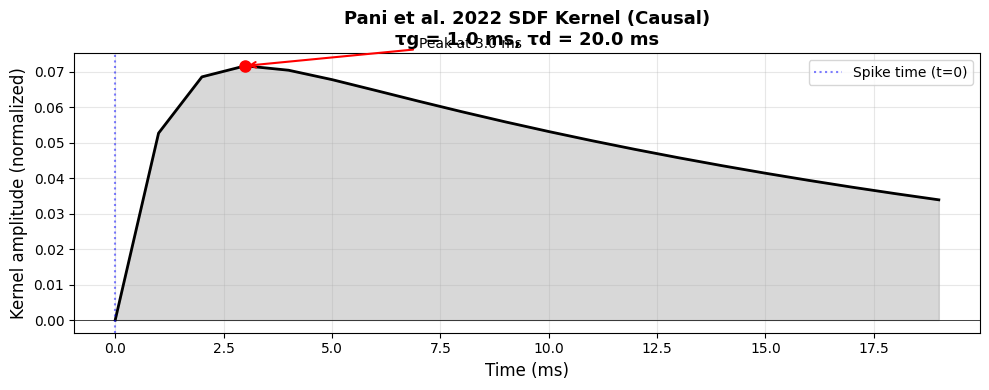

Kernel properties:
Duration: 20.0 ms
Time step (dt): 1.0 ms
Peak time: 3.00 ms
Peak value: 0.071599
Kernel sum: 1.000000 (should be ~1.0 for normalized kernel)

Causality: Spike at t=0 only affects t≥0 (no backward influence)


In [15]:
def pani_sdf_kernel(tau_g=1.0, tau_d=20.0, duration=20.0, dt=1.0):
    """
    Create the Pani et al. 2022 spike density function kernel.
    
    K(t) = [1 - exp(-t/τg)] × exp(-t/τd)
    
    Parameters:
    -----------
    tau_g : float
        Growth time constant (ms), default 1.0 ms
    tau_d : float
        Decay time constant (ms), default 20.0 ms
    duration : float
        Duration of kernel (ms), default 20 ms
    dt : float
        Time step (ms), default 1.0 ms
    
    Returns:
    --------
    t : ndarray
        Time array
    kernel : ndarray
        Kernel values (normalized to sum to 1)
    """
    t = np.arange(0, duration, dt)
    
    # Compute kernel: K(t) = [1 - exp(-t/τg)] × exp(-t/τd)
    kernel = (1 - np.exp(-t / tau_g)) * np.exp(-t / tau_d)
    
    # Normalize so kernel sums to 1 (preserves spike count)
    kernel = kernel / np.sum(kernel)
    
    return t, kernel


# Create and visualize the kernel
tau_g = 1.0  # ms
tau_d = 20.0  # ms
kernel_duration = 20.0  # ms (compact kernel for sharper temporal resolution)
dt = 1.0  # ms

t_kernel, kernel = pani_sdf_kernel(tau_g=tau_g, tau_d=tau_d, duration=kernel_duration, dt=dt)

# Plot the kernel
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
ax.plot(t_kernel, kernel, 'k-', linewidth=2)
ax.fill_between(t_kernel, kernel, alpha=0.3, color='gray')
ax.set_xlabel('Time (ms)', fontsize=12)
ax.set_ylabel('Kernel amplitude (normalized)', fontsize=12)
ax.set_title(f'Pani et al. 2022 SDF Kernel (Causal)\nτg = {tau_g} ms, τd = {tau_d} ms', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3)
ax.axhline(0, color='k', linewidth=0.5)
ax.axvline(0, color='blue', linestyle=':', linewidth=1.5, alpha=0.5, label='Spike time (t=0)')

# Add annotations
peak_idx = np.argmax(kernel)
peak_time = t_kernel[peak_idx]
peak_value = kernel[peak_idx]
ax.plot(peak_time, peak_value, 'ro', markersize=8)
ax.annotate(f'Peak at {peak_time:.1f} ms', 
            xy=(peak_time, peak_value), 
            xytext=(peak_time + 4, peak_value + 0.005),
            fontsize=10,
            arrowprops=dict(arrowstyle='->', color='red', lw=1.5))

ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

print(f"Kernel properties:")
print("=" * 60)
print(f"Duration: {kernel_duration} ms")
print(f"Time step (dt): {dt} ms")
print(f"Peak time: {peak_time:.2f} ms")
print(f"Peak value: {peak_value:.6f}")
print(f"Kernel sum: {np.sum(kernel):.6f} (should be ~1.0 for normalized kernel)")
print(f"\nCausality: Spike at t=0 only affects t≥0 (no backward influence)")

In [16]:
def spikes_to_sdf(spike_times, epoch, dt=1.0, tau_g=1.0, tau_d=20.0, kernel_duration=20.0):
    """
    Convert spike times to spike density function using Pani et al. 2022 kernel.
    
    CAUSAL: A spike at time t only affects time t and later (no backward influence).
    
    Parameters:
    -----------
    spike_times : ndarray
        Spike times (ms) relative to alignment point
    epoch : tuple
        (start, end) of epoch in ms
    dt : float
        Time step for binning (ms)
    tau_g : float
        Growth time constant (ms)
    tau_d : float
        Decay time constant (ms)
    kernel_duration : float
        Duration of kernel (ms)
    
    Returns:
    --------
    t : ndarray
        Time array
    sdf : ndarray
        Spike density function (spikes/sec)
    """
    # Create time bins
    t_bins = np.arange(epoch[0], epoch[1] + dt, dt)
    t_centers = t_bins[:-1] + dt / 2
    
    # Create spike train (binary: 1 where spike occurred, 0 otherwise)
    spike_train, _ = np.histogram(spike_times, bins=t_bins)
    
    # Get kernel
    _, kernel = pani_sdf_kernel(tau_g=tau_g, tau_d=tau_d, duration=kernel_duration, dt=dt)
    
    # Convolve spike train with kernel (CAUSAL)
    # mode='full' gives output of length N+M-1
    # Taking [:len(spike_train)] makes it causal: spike affects its own time and future
    sdf_full = np.convolve(spike_train, kernel, mode='full')
    sdf = sdf_full[:len(spike_train)]  # Causal: only take first N elements
    
    # Convert to spikes/sec (currently spikes/bin, bin size = dt ms)
    sdf = sdf * (1000.0 / dt)
    
    return t_centers, sdf


# Convolve the spikes with the SDF kernel
t_go, sdf_go = spikes_to_sdf(
    selected_trials['go_spikes'], 
    EPOK, 
    dt=dt,
    tau_g=tau_g, 
    tau_d=tau_d,
    kernel_duration=kernel_duration
)

t_stop, sdf_stop = spikes_to_sdf(
    selected_trials['stop_spikes'], 
    EPOK,
    dt=dt,
    tau_g=tau_g, 
    tau_d=tau_d,
    kernel_duration=kernel_duration
)

print(f"SDF computation (CAUSAL):")
print("=" * 60)
print(f"Time resolution (dt): {dt} ms")
print(f"Epoch: {EPOK} ms")
print(f"Kernel duration: {kernel_duration} ms")
print(f"Number of time points: {len(t_go)}")
print(f"\nGO trial:")
print(f"  Mean firing rate: {np.mean(sdf_go):.2f} spikes/sec")
print(f"  Max firing rate: {np.max(sdf_go):.2f} spikes/sec")
print(f"\nSTOP trial:")
print(f"  Mean firing rate: {np.mean(sdf_stop):.2f} spikes/sec")
print(f"  Max firing rate: {np.max(sdf_stop):.2f} spikes/sec")
print(f"\nNote: Spikes only influence their own time point and the future (causal filtering)")

SDF computation (CAUSAL):
Time resolution (dt): 1.0 ms
Epoch: [-100, 350] ms
Kernel duration: 20.0 ms
Number of time points: 450

GO trial:
  Mean firing rate: 0.00 spikes/sec
  Max firing rate: 0.00 spikes/sec

STOP trial:
  Mean firing rate: 2.22 spikes/sec
  Max firing rate: 71.60 spikes/sec

Note: Spikes only influence their own time point and the future (causal filtering)


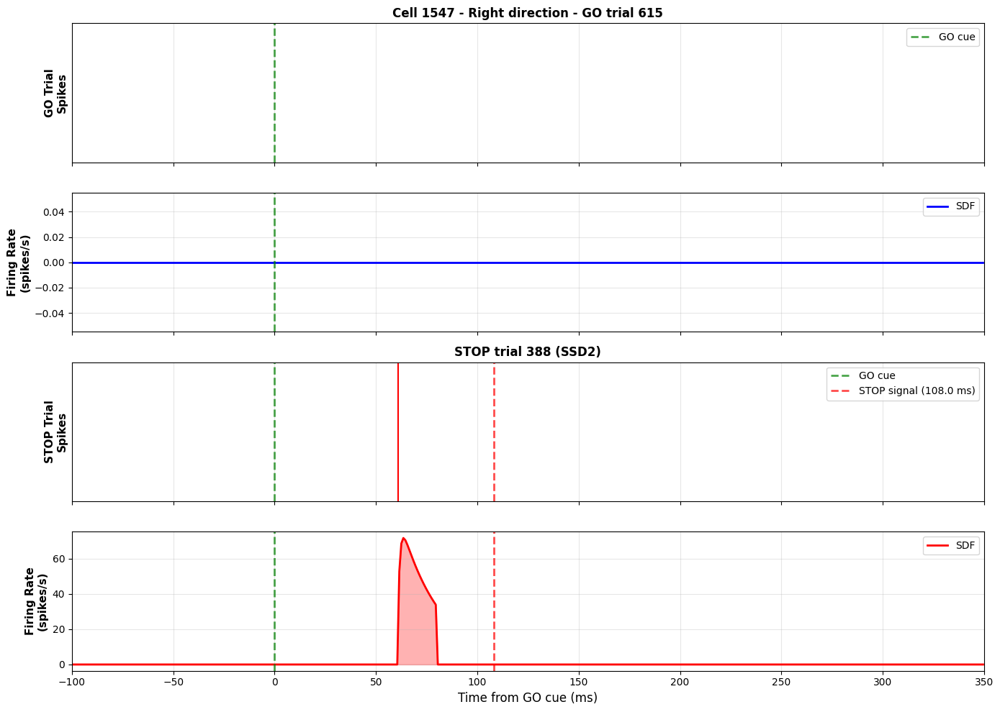

In [17]:
# Plot spike rasters and SDFs together
fig, axes = plt.subplots(4, 1, figsize=(14, 10), sharex=True)

# GO trial - Spike raster
ax_go_raster = axes[0]
ax_go_raster.eventplot(selected_trials['go_spikes'], colors='blue', linewidths=1.5)
ax_go_raster.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue', alpha=0.7)
ax_go_raster.set_ylabel('GO Trial\nSpikes', fontsize=11, fontweight='bold')
ax_go_raster.set_title(f"Cell {example_cell_id} - {dir_map[DIRECTION]} direction - GO trial {selected_trials['go_trial_num']}", 
                        fontsize=12, fontweight='bold')
ax_go_raster.set_ylim(0.5, 1.5)
ax_go_raster.set_yticks([])
ax_go_raster.legend(loc='upper right')
ax_go_raster.grid(axis='x', alpha=0.3)

# GO trial - SDF
ax_go_sdf = axes[1]
ax_go_sdf.plot(t_go, sdf_go, 'b-', linewidth=2, label='SDF')
ax_go_sdf.fill_between(t_go, sdf_go, alpha=0.3, color='blue')
ax_go_sdf.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7)
ax_go_sdf.set_ylabel('Firing Rate\n(spikes/s)', fontsize=11, fontweight='bold')
ax_go_sdf.grid(alpha=0.3)
ax_go_sdf.legend(loc='upper right')

# STOP trial - Spike raster
ax_stop_raster = axes[2]
ax_stop_raster.eventplot(selected_trials['stop_spikes'], colors='red', linewidths=1.5)
ax_stop_raster.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue', alpha=0.7)

# Add stop signal marker
stop_signal_time = selected_trials['stop']['stop_cue'] - selected_trials['stop']['go_cue']
if not np.isnan(stop_signal_time):
    ax_stop_raster.axvline(stop_signal_time, color='red', linestyle='--', linewidth=2, 
                           label=f'STOP signal ({stop_signal_time:.1f} ms)', alpha=0.7)

ax_stop_raster.set_ylabel('STOP Trial\nSpikes', fontsize=11, fontweight='bold')
ax_stop_raster.set_title(f"STOP trial {selected_trials['stop_trial_num']} (SSD{SSD_NUM})", 
                         fontsize=12, fontweight='bold')
ax_stop_raster.set_ylim(0.5, 1.5)
ax_stop_raster.set_yticks([])
ax_stop_raster.legend(loc='upper right')
ax_stop_raster.grid(axis='x', alpha=0.3)

# STOP trial - SDF
ax_stop_sdf = axes[3]
ax_stop_sdf.plot(t_stop, sdf_stop, 'r-', linewidth=2, label='SDF')
ax_stop_sdf.fill_between(t_stop, sdf_stop, alpha=0.3, color='red')
ax_stop_sdf.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7)
if not np.isnan(stop_signal_time):
    ax_stop_sdf.axvline(stop_signal_time, color='red', linestyle='--', linewidth=2, alpha=0.7)
ax_stop_sdf.set_ylabel('Firing Rate\n(spikes/s)', fontsize=11, fontweight='bold')
ax_stop_sdf.set_xlabel('Time from GO cue (ms)', fontsize=12)
ax_stop_sdf.grid(alpha=0.3)
ax_stop_sdf.legend(loc='upper right')

# Set common x-axis limits
for ax in axes:
    ax.set_xlim(EPOK)

plt.tight_layout()
plt.show()

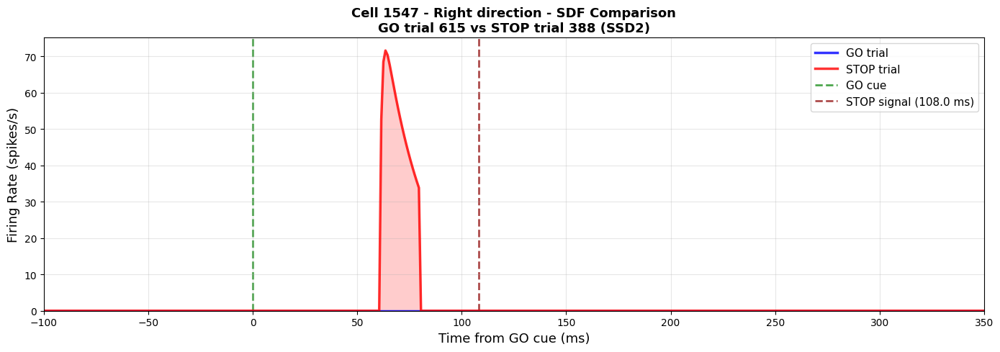

SDF Comparison Metrics:
Mean firing rate difference (GO - STOP): -2.22 spikes/s
Max absolute difference: 71.60 spikes/s
Correlation between GO and STOP SDFs: nan


In [18]:
# Overlay GO and STOP SDFs for direct comparison
fig, ax = plt.subplots(1, 1, figsize=(14, 5))

# Plot both SDFs
ax.plot(t_go, sdf_go, 'b-', linewidth=2.5, label='GO trial', alpha=0.8)
ax.plot(t_stop, sdf_stop, 'r-', linewidth=2.5, label='STOP trial', alpha=0.8)

# Fill areas
ax.fill_between(t_go, sdf_go, alpha=0.2, color='blue')
ax.fill_between(t_stop, sdf_stop, alpha=0.2, color='red')

# Add event markers
ax.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue', alpha=0.7, zorder=1)
if not np.isnan(stop_signal_time):
    ax.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, 
               label=f'STOP signal ({stop_signal_time:.1f} ms)', alpha=0.7, zorder=1)

# Labels and formatting
ax.set_xlabel('Time from GO cue (ms)', fontsize=13)
ax.set_ylabel('Firing Rate (spikes/s)', fontsize=13)
ax.set_title(f'Cell {example_cell_id} - {dir_map[DIRECTION]} direction - SDF Comparison\n' + 
             f'GO trial {selected_trials["go_trial_num"]} vs STOP trial {selected_trials["stop_trial_num"]} (SSD{SSD_NUM})',
             fontsize=13, fontweight='bold')
ax.legend(loc='upper right', fontsize=11)
ax.grid(alpha=0.3)
ax.set_xlim(EPOK)

# Set y-axis to start at 0
ax.set_ylim(bottom=0)

plt.tight_layout()
plt.show()

# Compute and display difference metrics
print(f"SDF Comparison Metrics:")
print("=" * 60)
print(f"Mean firing rate difference (GO - STOP): {np.mean(sdf_go - sdf_stop):.2f} spikes/s")
print(f"Max absolute difference: {np.max(np.abs(sdf_go - sdf_stop)):.2f} spikes/s")
print(f"Correlation between GO and STOP SDFs: {np.corrcoef(sdf_go, sdf_stop)[0, 1]:.3f}")

## 8. Rolling Window Distance Analysis

Compute the distance between GO and STOP trial SDFs in a rolling 10 ms window.

In [19]:
def rolling_window_distance(sdf1, sdf2, window_size_ms=10, dt=1.0):
    """
    Compute distance between two SDFs in a rolling window.
    
    Parameters:
    -----------
    sdf1, sdf2 : ndarray
        Spike density functions (same length)
    window_size_ms : float
        Window size in ms
    dt : float
        Time step in ms
    
    Returns:
    --------
    distances : ndarray
        Euclidean distance in each window
    window_centers : ndarray
        Center time of each window
    """
    # Convert window size to number of samples
    window_size = int(window_size_ms / dt)
    
    # Compute distances for each window position
    n_windows = len(sdf1) - window_size + 1
    distances = np.zeros(n_windows)
    
    for i in range(n_windows):
        # Extract window
        sdf1_window = sdf1[i:i + window_size]
        sdf2_window = sdf2[i:i + window_size]
        
        # Compute Euclidean distance
        # distances[i] = np.sqrt(np.sum((sdf1_window - sdf2_window)**2))
        # Mean squared difference across the window
        distances[i] = np.sqrt(np.mean((sdf1_window - sdf2_window)**2))
    
    # Compute window centers (in sample indices)
    window_centers = np.arange(n_windows) + window_size // 2
    
    return distances, window_centers


# Compute rolling window distance
window_size_ms = 10  # ms
distances, window_centers_idx = rolling_window_distance(
    sdf_go, sdf_stop, 
    window_size_ms=window_size_ms, 
    dt=dt
)

# Convert window center indices to time
window_centers_time = t_go[window_centers_idx]

print(f"Rolling Window Distance Analysis:")
print("=" * 60)
print(f"Window size: {window_size_ms} ms")
print(f"Number of windows: {len(distances)}")
print(f"Time range: [{window_centers_time[0]:.1f}, {window_centers_time[-1]:.1f}] ms")
print(f"\nDistance statistics:")
print(f"  Mean distance: {np.mean(distances):.2f}")
print(f"  Max distance: {np.max(distances):.2f}")
print(f"  Min distance: {np.min(distances):.2f}")
print(f"  Std distance: {np.std(distances):.2f}")

# Find time of maximum distance
max_dist_idx = np.argmax(distances)
max_dist_time = window_centers_time[max_dist_idx]
print(f"\nMaximum distance at: {max_dist_time:.1f} ms (distance = {distances[max_dist_idx]:.2f})")

Rolling Window Distance Analysis:
Window size: 10 ms
Number of windows: 441
Time range: [-94.5, 345.5] ms

Distance statistics:
  Mean distance: 2.65
  Max distance: 62.84
  Min distance: 0.00
  Std distance: 10.89

Maximum distance at: 66.5 ms (distance = 62.84)


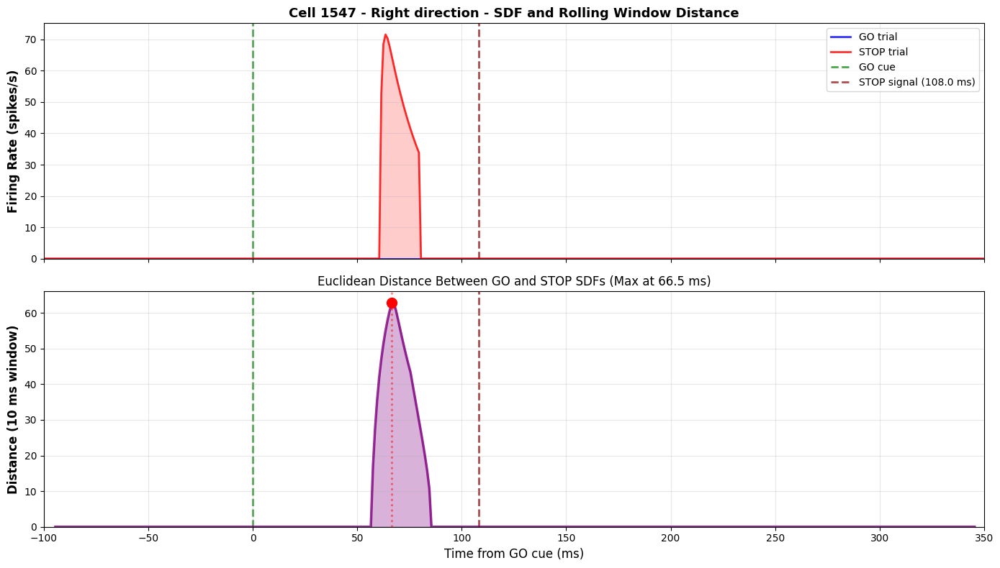

In [20]:
# Plot the distance over time
fig, axes = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# Top panel: Overlay SDFs
ax_sdf = axes[0]
ax_sdf.plot(t_go, sdf_go, 'b-', linewidth=2, label='GO trial', alpha=0.8)
ax_sdf.plot(t_stop, sdf_stop, 'r-', linewidth=2, label='STOP trial', alpha=0.8)
ax_sdf.fill_between(t_go, sdf_go, alpha=0.2, color='blue')
ax_sdf.fill_between(t_stop, sdf_stop, alpha=0.2, color='red')

# Add event markers
ax_sdf.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue', alpha=0.7, zorder=1)
if not np.isnan(stop_signal_time):
    ax_sdf.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, 
                   label=f'STOP signal ({stop_signal_time:.1f} ms)', alpha=0.7, zorder=1)

ax_sdf.set_ylabel('Firing Rate (spikes/s)', fontsize=12, fontweight='bold')
ax_sdf.set_title(f'Cell {example_cell_id} - {dir_map[DIRECTION]} direction - SDF and Rolling Window Distance', 
                 fontsize=13, fontweight='bold')
ax_sdf.legend(loc='upper right', fontsize=10)
ax_sdf.grid(alpha=0.3)
ax_sdf.set_ylim(bottom=0)

# Bottom panel: Distance over time
ax_dist = axes[1]
ax_dist.plot(window_centers_time, distances, 'purple', linewidth=2.5, alpha=0.8)
ax_dist.fill_between(window_centers_time, distances, alpha=0.3, color='purple')

# Mark maximum distance
ax_dist.plot(max_dist_time, distances[max_dist_idx], 'ro', markersize=10, zorder=5)
ax_dist.axvline(max_dist_time, color='red', linestyle=':', linewidth=2, alpha=0.5)

# Add event markers
ax_dist.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.7, zorder=1)
if not np.isnan(stop_signal_time):
    ax_dist.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, alpha=0.7, zorder=1)

ax_dist.set_xlabel('Time from GO cue (ms)', fontsize=12)
ax_dist.set_ylabel(f'Distance ({window_size_ms} ms window)', fontsize=12, fontweight='bold')
ax_dist.set_title(f'Euclidean Distance Between GO and STOP SDFs (Max at {max_dist_time:.1f} ms)', 
                  fontsize=12)
ax_dist.grid(alpha=0.3)
ax_dist.set_ylim(bottom=0)

# Set common x-axis limits
for ax in axes:
    ax.set_xlim(EPOK)

plt.tight_layout()
plt.show()

## 9. Random Sampling Approach - Single Neuron

Sample multiple GO-GO and GO-STOP trial pairs to compute robust distance estimates.

In [21]:
def compute_trial_pair_distance(trial1_data, trial2_data, epoch, window_size_ms=10, 
                                 dt=1.0, tau_g=1.0, tau_d=20.0, kernel_duration=20.0):
    """
    Compute rolling window distance between two trials.
    
    Parameters:
    -----------
    trial1_data, trial2_data : pandas Series
        Trial data rows containing 'neural_data' and 'go_cue'
    epoch : tuple
        (start, end) of epoch in ms
    window_size_ms : float
        Window size for distance computation
    dt, tau_g, tau_d, kernel_duration : float
        SDF parameters
    
    Returns:
    --------
    distances : ndarray
        Distance in each window
    window_centers_time : ndarray
        Time of window centers
    """
    # Extract spike times relative to go_cue
    spikes1 = trial1_data['neural_data'] - trial1_data['go_cue']
    spikes2 = trial2_data['neural_data'] - trial2_data['go_cue']
    
    # Filter to epoch
    spikes1 = spikes1[(spikes1 >= epoch[0]) & (spikes1 <= epoch[1])]
    spikes2 = spikes2[(spikes2 >= epoch[0]) & (spikes2 <= epoch[1])]
    
    # Compute SDFs
    t1, sdf1 = spikes_to_sdf(spikes1, epoch, dt, tau_g, tau_d, kernel_duration)
    t2, sdf2 = spikes_to_sdf(spikes2, epoch, dt, tau_g, tau_d, kernel_duration)
    
    # Compute rolling window distance
    distances, window_centers_idx = rolling_window_distance(sdf1, sdf2, window_size_ms, dt)
    window_centers_time = t1[window_centers_idx]
    
    return distances, window_centers_time


def sample_trial_pairs_distances(cell_data, trial_type1, trial_type2, direction, 
                                   ssd_number, n_samples, epoch, window_size_ms=10,
                                   random_state=None):
    """
    Sample random pairs of trials and compute distances.
    
    Parameters:
    -----------
    cell_data : DataFrame
        Data for a single cell
    trial_type1, trial_type2 : str
        Trial types ('GO' or 'STOP')
    direction : int
        Direction (0 or 180)
    ssd_number : float
        SSD level for STOP trials (ignored for GO)
    n_samples : int
        Number of random pairs to sample
    epoch : tuple
        Time epoch
    window_size_ms : float
        Rolling window size
    random_state : int, optional
        Random seed for reproducibility
    
    Returns:
    --------
    all_distances : ndarray (n_samples x n_windows)
        Distances for all sampled pairs
    window_centers_time : ndarray
        Time points
    """
    if random_state is not None:
        np.random.seed(random_state)
    
    # Get trials for each type
    trials1 = filter_trials(cell_data, trial_type1, direction, 
                            ssd_number if trial_type1 == 'STOP' else None, 
                            success_only=True)
    trials2 = filter_trials(cell_data, trial_type2, direction,
                            ssd_number if trial_type2 == 'STOP' else None,
                            success_only=True)
    
    # Get unique trial numbers
    trial_nums1 = trials1['trial_number'].unique()
    trial_nums2 = trials2['trial_number'].unique()
    
    if len(trial_nums1) == 0 or len(trial_nums2) == 0:
        raise ValueError(f"No trials found for {trial_type1} or {trial_type2}")
    
    # Sample pairs
    all_distances = []
    for i in range(n_samples):
        # Sample random trial numbers
        t1_num = np.random.choice(trial_nums1)
        
        # For GO-GO pairs, ensure we don't sample the same trial twice
        if trial_type1 == trial_type2:
            available_nums = trial_nums2[trial_nums2 != t1_num]
            if len(available_nums) == 0:
                continue  # Skip if only one trial available
            t2_num = np.random.choice(available_nums)
        else:
            t2_num = np.random.choice(trial_nums2)
        
        # Get trial data
        trial1 = trials1[trials1['trial_number'] == t1_num].iloc[0]
        trial2 = trials2[trials2['trial_number'] == t2_num].iloc[0]
        
        # Compute distance
        distances, window_centers_time = compute_trial_pair_distance(
            trial1, trial2, epoch, window_size_ms
        )
        
        all_distances.append(distances)
    
    all_distances = np.array(all_distances)
    
    return all_distances, window_centers_time

print("Functions created successfully!")

Functions created successfully!


In [22]:
# Sampling parameters
n_samples = 1000  # Number of random pairs to sample
random_state = 42

# Filter data for example cell
cell_data = session.data[session.data['cell_ID'] == example_cell_id]

print(f"Sampling trial pairs for Cell {example_cell_id}")
print("=" * 60)

# Sample GO-GO pairs (baseline)
print(f"\nSampling {n_samples} GO-GO pairs...")
go_go_distances, time_centers = sample_trial_pairs_distances(
    cell_data=cell_data,
    trial_type1='GO',
    trial_type2='GO',
    direction=DIRECTION,
    ssd_number=SSD_NUM,
    n_samples=n_samples,
    epoch=EPOK,
    window_size_ms=window_size_ms,
    random_state=random_state
)

print(f"  Sampled {go_go_distances.shape[0]} GO-GO pairs")
print(f"  Distance array shape: {go_go_distances.shape}")
print(f"  Mean distance across all windows and samples: {np.mean(go_go_distances):.2f}")
print(f"  Std distance: {np.std(go_go_distances):.2f}")

Sampling trial pairs for Cell 1547

Sampling 1000 GO-GO pairs...
  Sampled 1000 GO-GO pairs
  Distance array shape: (1000, 441)
  Mean distance across all windows and samples: 2.61
  Std distance: 11.68


In [23]:
# Sample GO-STOP pairs (divergence signal)
print(f"\nSampling {n_samples} GO-STOP pairs...")
go_stop_distances, _ = sample_trial_pairs_distances(
    cell_data=cell_data,
    trial_type1='GO',
    trial_type2='STOP',
    direction=DIRECTION,
    ssd_number=SSD_NUM,
    n_samples=n_samples,
    epoch=EPOK,
    window_size_ms=window_size_ms,
    random_state=random_state
)

print(f"  Sampled {go_stop_distances.shape[0]} GO-STOP pairs")
print(f"  Distance array shape: {go_stop_distances.shape}")
print(f"  Mean distance across all windows and samples: {np.mean(go_stop_distances):.2f}")
print(f"  Std distance: {np.std(go_stop_distances):.2f}")

print(f"\n{'='*60}")
print("Sampling complete!")
print(f"GO-GO baseline: {go_go_distances.shape[0]} samples")
print(f"GO-STOP divergence: {go_stop_distances.shape[0]} samples")
print(f"Time points per sample: {go_go_distances.shape[1]}")
print(f"Time range: [{time_centers[0]:.1f}, {time_centers[-1]:.1f}] ms")


Sampling 1000 GO-STOP pairs...
  Sampled 1000 GO-STOP pairs
  Distance array shape: (1000, 441)
  Mean distance across all windows and samples: 3.24
  Std distance: 15.27

Sampling complete!
GO-GO baseline: 1000 samples
GO-STOP divergence: 1000 samples
Time points per sample: 441
Time range: [-94.5, 345.5] ms


In [24]:
# Compute statistics across samples
# GO-GO baseline
go_go_mean = np.mean(go_go_distances, axis=0)
go_go_std = np.std(go_go_distances, axis=0)
go_go_sem = go_go_std / np.sqrt(go_go_distances.shape[0])  # Standard error of mean

# GO-STOP divergence
go_stop_mean = np.mean(go_stop_distances, axis=0)
go_stop_std = np.std(go_stop_distances, axis=0)
go_stop_sem = go_stop_std / np.sqrt(go_stop_distances.shape[0])

print(f"Statistics across samples:")
print("=" * 60)
print(f"\nGO-GO Baseline:")
print(f"  Mean distance (averaged over time): {np.mean(go_go_mean):.2f}")
print(f"  Std of mean distances: {np.std(go_go_mean):.2f}")
print(f"  Max mean distance: {np.max(go_go_mean):.2f} at {time_centers[np.argmax(go_go_mean)]:.1f} ms")

print(f"\nGO-STOP Divergence:")
print(f"  Mean distance (averaged over time): {np.mean(go_stop_mean):.2f}")
print(f"  Std of mean distances: {np.std(go_stop_mean):.2f}")
print(f"  Max mean distance: {np.max(go_stop_mean):.2f} at {time_centers[np.argmax(go_stop_mean)]:.1f} ms")

print(f"\nDifference (GO-STOP - GO-GO):")
diff_mean = np.abs(go_stop_mean - go_go_mean)
print(f"  Mean difference: {np.mean(diff_mean):.2f}")
print(f"  Max difference: {np.max(diff_mean):.2f} at {time_centers[np.argmax(diff_mean)]:.1f} ms")

Statistics across samples:

GO-GO Baseline:
  Mean distance (averaged over time): 2.61
  Std of mean distances: 2.52
  Max mean distance: 9.70 at 62.5 ms

GO-STOP Divergence:
  Mean distance (averaged over time): 3.24
  Std of mean distances: 4.35
  Max mean distance: 19.60 at -3.5 ms

Difference (GO-STOP - GO-GO):
  Mean difference: 1.77
  Max difference: 12.89 at -3.5 ms


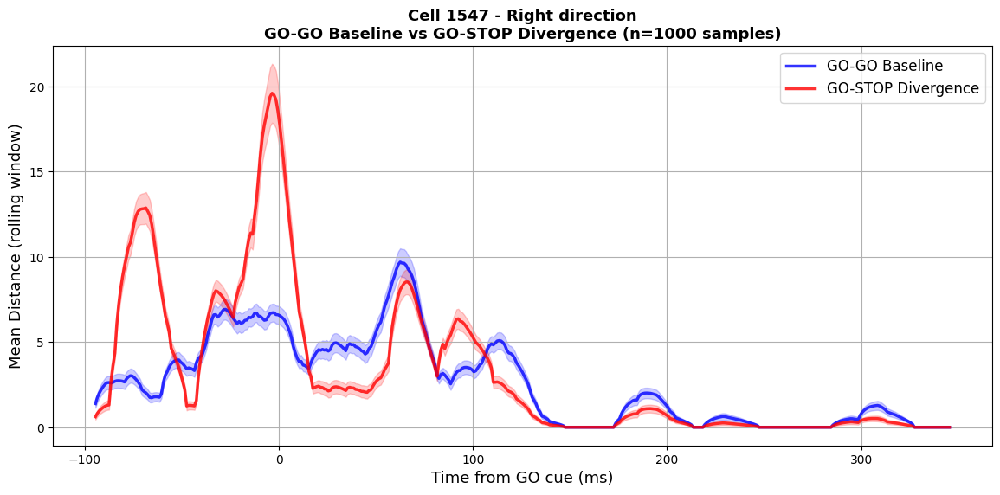

Plotted divergence analysis for cell 1547 in Right direction.


In [25]:
# Plot the results
fig, ax = plt.subplots(1, 1, figsize=(14, 6))
# Plot GO-GO baseline
ax.plot(time_centers, go_go_mean, 'b-', linewidth=2.5, label='GO-GO Baseline', alpha=0.8)
ax.fill_between(time_centers, 
                go_go_mean - go_go_sem, 
                go_go_mean + go_go_sem, 
                color='blue', alpha=0.2)
# Plot GO-STOP divergence
ax.plot(time_centers, go_stop_mean, 'r-', linewidth=2.5, label='GO-STOP Divergence', alpha=0.8)
ax.fill_between(time_centers, 
                go_stop_mean - go_stop_sem, 
                go_stop_mean + go_stop_sem, 
                color='red', alpha=0.2)                 
# Labels and formatting
ax.set_xlabel('Time from GO cue (ms)', fontsize=13)
ax.set_ylabel('Mean Distance (rolling window)', fontsize=13)
ax.set_title(f'Cell {example_cell_id} - {dir_map[DIRECTION]} direction\n' + 
             f'GO-GO Baseline vs GO-STOP Divergence (n={n_samples} samples)', 
             fontsize=13, fontweight='bold')
ax.legend(fontsize=12)
ax.grid(True)
plt.show()

print(f"Plotted divergence analysis for cell {example_cell_id} in {dir_map[DIRECTION]} direction.")


## 10. Population Analysis - All Valid Neurons

Extend the random sampling analysis to all neurons with sufficient STOP trials.

In [26]:
# ============================================================================
# PARALLEL PROCESSING - Analyze all valid neurons
# ============================================================================

from joblib import Parallel, delayed
from tqdm.notebook import tqdm
import numpy as np

def process_single_neuron_wrapper(i, cell_id, session_data, DIRECTION, SSD_NUM,
                                   n_samples, window_size_ms, EPOK, random_state):
    """
    Worker function to process a single neuron in parallel.
    """
    try:
        # Get data for this cell
        cell_data = session_data[session_data['cell_ID'] == cell_id]
        
        # Sample GO-GO pairs
        gg_dist, t_centers = sample_trial_pairs_distances(
            cell_data=cell_data,
            trial_type1='GO',
            trial_type2='GO',
            direction=DIRECTION,
            ssd_number=SSD_NUM,
            n_samples=n_samples,
            epoch=EPOK,
            window_size_ms=window_size_ms,
            random_state=random_state + i
        )
        
        # Sample GO-STOP pairs
        gs_dist, _ = sample_trial_pairs_distances(
            cell_data=cell_data,
            trial_type1='GO',
            trial_type2='STOP',
            direction=DIRECTION,
            ssd_number=SSD_NUM,
            n_samples=n_samples,
            epoch=EPOK,
            window_size_ms=window_size_ms,
            random_state=random_state + i
        )
        
        # Compute statistics
        gg_mean = np.mean(gg_dist, axis=0)
        gg_std = np.std(gg_dist, axis=0)
        gs_mean = np.mean(gs_dist, axis=0)
        gs_std = np.std(gs_dist, axis=0)
        div_mean = np.abs(gs_mean - gg_mean)
        
        # Find peak divergence
        peak_idx = np.argmax(div_mean)
        peak_time = t_centers[peak_idx]
        peak_val = div_mean[peak_idx]
        
        return {
            'cell_id': cell_id,
            'go_go_mean': gg_mean,
            'go_go_std': gg_std,
            'go_stop_mean': gs_mean,
            'go_stop_std': gs_std,
            'divergence_mean': div_mean,
            'peak_divergence_time': peak_time,
            'peak_divergence_value': peak_val,
            't_centers': t_centers,  # Include time centers
            'success': True,
            'error': None
        }
    except Exception as e:
        return {
            'cell_id': cell_id,
            'success': False,
            'error': str(e)
        }

# ============================================================================
# Run parallel processing
# ============================================================================

print(f"Analyzing {len(valid_neurons)} neurons in parallel...")
print(f"Using all available CPU cores")
print("=" * 60)

window_size_ms = 10

# Run parallel processing with tqdm progress bar
results = Parallel(n_jobs=-1)(
    delayed(process_single_neuron_wrapper)(
        i, cell_id, 
        session.data[session.data['cell_ID'] == cell_id], 
        DIRECTION, SSD_NUM,
        n_samples, window_size_ms, EPOK, random_state
    )
    for i, cell_id in tqdm(enumerate(valid_neurons), total=len(valid_neurons), desc="Processing neurons")
)

# ============================================================================
# Gather results
# ============================================================================

# Storage for results
all_neuron_results = {
    'cell_ids': [],
    'go_go_mean': [],
    'go_go_std': [],
    'go_stop_mean': [],
    'go_stop_std': [],
    'divergence_mean': [],
    'peak_divergence_time': [],
    'peak_divergence_value': []
}

# Extract t_centers from first successful result
t_centers = None

# Process results
failed_count = 0
for result in results:
    if result['success']:
        # Extract t_centers from first successful result
        if t_centers is None:
            t_centers = result['t_centers']
        
        all_neuron_results['cell_ids'].append(result['cell_id'])
        all_neuron_results['go_go_mean'].append(result['go_go_mean'])
        all_neuron_results['go_go_std'].append(result['go_go_std'])
        all_neuron_results['go_stop_mean'].append(result['go_stop_mean'])
        all_neuron_results['go_stop_std'].append(result['go_stop_std'])
        all_neuron_results['divergence_mean'].append(result['divergence_mean'])
        all_neuron_results['peak_divergence_time'].append(result['peak_divergence_time'])
        all_neuron_results['peak_divergence_value'].append(result['peak_divergence_value'])
    else:
        failed_count += 1
        print(f"WARNING: Failed for cell {result['cell_id']}: {result['error']}")

# Convert lists to arrays
for key in ['go_go_mean', 'go_go_std', 'go_stop_mean', 'go_stop_std', 'divergence_mean']:
    all_neuron_results[key] = np.array(all_neuron_results[key])

print(f"\n{'='*60}")
print(f"Analysis complete!")
print(f"Successfully analyzed: {len(all_neuron_results['cell_ids'])} neurons")
print(f"Failed: {failed_count} neurons")


Analyzing 2773 neurons in parallel...
Using all available CPU cores


Processing neurons:   0%|          | 0/2773 [00:00<?, ?it/s]


Analysis complete!
Successfully analyzed: 2773 neurons
Failed: 0 neurons


In [27]:
# Aggregate across all neurons
go_go_population_mean = np.mean(all_neuron_results['go_go_mean'], axis=0)
go_go_population_std = np.std(all_neuron_results['go_go_mean'], axis=0)
go_go_population_sem = go_go_population_std / np.sqrt(len(all_neuron_results['cell_ids']))

go_stop_population_mean = np.mean(all_neuron_results['go_stop_mean'], axis=0)
go_stop_population_std = np.std(all_neuron_results['go_stop_mean'], axis=0)
go_stop_population_sem = go_stop_population_std / np.sqrt(len(all_neuron_results['cell_ids']))

divergence_population_mean = np.mean(all_neuron_results['divergence_mean'], axis=0)
divergence_population_std = np.std(all_neuron_results['divergence_mean'], axis=0)
divergence_population_sem = divergence_population_std / np.sqrt(len(all_neuron_results['cell_ids']))

print(f"Population Statistics ({len(all_neuron_results['cell_ids'])} neurons):")
print("=" * 60)
print(f"\nGO-GO Baseline:")
print(f"  Mean distance: {np.mean(go_go_population_mean):.2f}")
print(f"  Peak mean distance: {np.max(go_go_population_mean):.2f} at {t_centers[np.argmax(go_go_population_mean)]:.1f} ms")

print(f"\nGO-STOP Divergence:")
print(f"  Mean distance: {np.mean(go_stop_population_mean):.2f}")
print(f"  Peak mean distance: {np.max(go_stop_population_mean):.2f} at {t_centers[np.argmax(go_stop_population_mean)]:.1f} ms")

print(f"\nPopulation Divergence Signal:")
peak_pop_div_idx = np.argmax(divergence_population_mean)
peak_pop_div_time = t_centers[peak_pop_div_idx]
peak_pop_div_value = divergence_population_mean[peak_pop_div_idx]
print(f"  Mean divergence: {np.mean(divergence_population_mean):.2f}")
print(f"  Peak divergence: {peak_pop_div_value:.2f} at {peak_pop_div_time:.1f} ms")

# Statistics on peak divergence times across neurons
peak_times = np.array(all_neuron_results['peak_divergence_time'])
peak_values = np.array(all_neuron_results['peak_divergence_value'])

print(f"\nPer-Neuron Peak Divergence Statistics:")
print(f"  Mean peak time: {np.mean(peak_times):.2f} ms (std: {np.std(peak_times):.2f} ms)")
print(f"  Median peak time: {np.median(peak_times):.2f} ms")
print(f"  Mean peak value: {np.mean(peak_values):.2f} (std: {np.std(peak_values):.2f})")

Population Statistics (2773 neurons):

GO-GO Baseline:
  Mean distance: 12.36
  Peak mean distance: 13.14 at 134.5 ms

GO-STOP Divergence:
  Mean distance: 12.50
  Peak mean distance: 13.19 at 134.5 ms

Population Divergence Signal:
  Mean divergence: 3.09
  Peak divergence: 3.65 at 298.5 ms

Per-Neuron Peak Divergence Statistics:
  Mean peak time: 140.31 ms (std: 132.20 ms)
  Median peak time: 149.50 ms
  Mean peak value: 11.67 (std: 7.29)


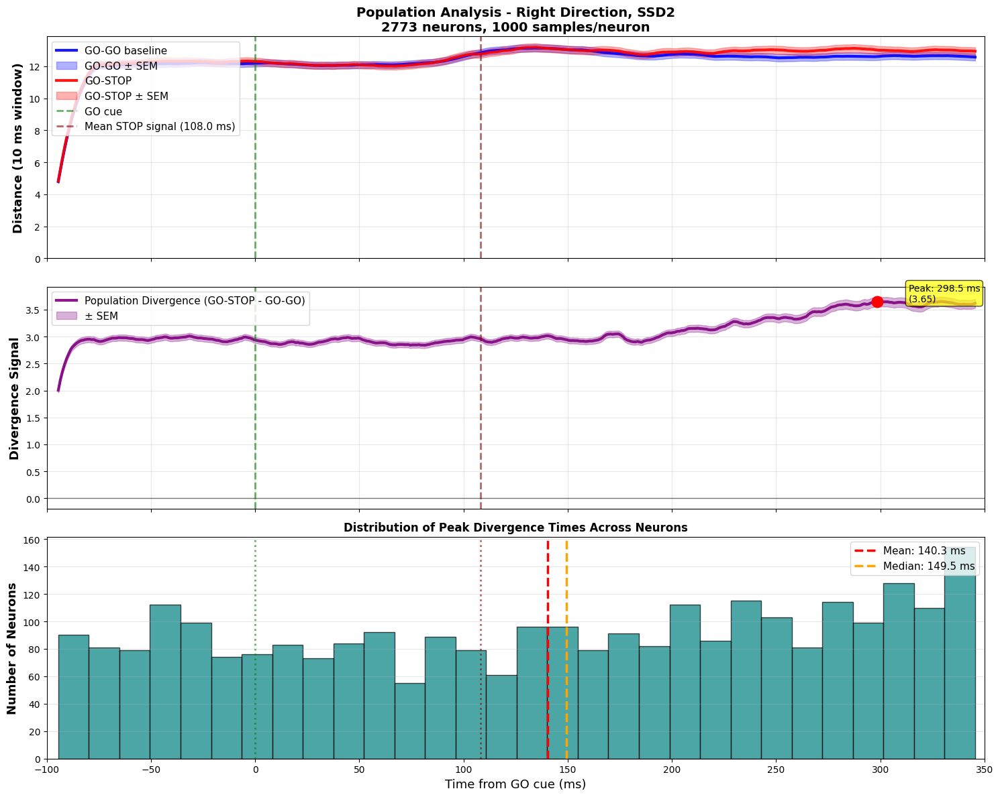


Key Findings:
Mean STOP signal delay: 108.0 ms
Population peak divergence: 298.5 ms
Time from STOP signal to peak: 190.5 ms


In [28]:
# Population-level visualization
fig, axes = plt.subplots(3, 1, figsize=(15, 12), sharex=True)

# Top panel: GO-GO and GO-STOP population averages
ax1 = axes[0]
ax1.plot(t_centers, go_go_population_mean, 'b-', linewidth=3, label='GO-GO baseline', alpha=0.9)
ax1.fill_between(t_centers, 
                  go_go_population_mean - go_go_population_sem, 
                  go_go_population_mean + go_go_population_sem, 
                  color='blue', alpha=0.3, label='GO-GO ± SEM')

ax1.plot(t_centers, go_stop_population_mean, 'r-', linewidth=3, label='GO-STOP', alpha=0.9)
ax1.fill_between(t_centers, 
                  go_stop_population_mean - go_stop_population_sem, 
                  go_stop_population_mean + go_stop_population_sem, 
                  color='red', alpha=0.3, label='GO-STOP ± SEM')

ax1.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6, label='GO cue')
mean_ssd_for_plot = stop_trials['ssd_len'].mean()
ax1.axvline(mean_ssd_for_plot, color='darkred', linestyle='--', linewidth=2, 
            alpha=0.6, label=f'Mean STOP signal ({mean_ssd_for_plot:.1f} ms)')

ax1.set_ylabel(f'Distance ({window_size_ms} ms window)', fontsize=13, fontweight='bold')
ax1.set_title(f'Population Analysis - {dir_map[DIRECTION]} Direction, SSD{SSD_NUM}\n' + 
              f'{len(all_neuron_results["cell_ids"])} neurons, {n_samples} samples/neuron', 
              fontsize=14, fontweight='bold')
ax1.legend(loc='upper left', fontsize=11)
ax1.grid(alpha=0.3)
ax1.set_ylim(bottom=0)

# Middle panel: Population divergence signal
ax2 = axes[1]
ax2.plot(t_centers, divergence_population_mean, 'purple', linewidth=3, alpha=0.9, 
         label='Population Divergence (GO-STOP - GO-GO)')
ax2.fill_between(t_centers, 
                  divergence_population_mean - divergence_population_sem, 
                  divergence_population_mean + divergence_population_sem, 
                  color='purple', alpha=0.3, label='± SEM')
ax2.axhline(0, color='black', linestyle='-', linewidth=1, alpha=0.5)
ax2.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6)
ax2.axvline(mean_ssd_for_plot, color='darkred', linestyle='--', linewidth=2, alpha=0.6)

# Mark peak
ax2.plot(peak_pop_div_time, peak_pop_div_value, 'ro', markersize=12, zorder=5)
ax2.text(peak_pop_div_time + 15, peak_pop_div_value, 
         f'Peak: {peak_pop_div_time:.1f} ms\n({peak_pop_div_value:.2f})',
         fontsize=10, bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))

ax2.set_ylabel('Divergence Signal', fontsize=13, fontweight='bold')
ax2.legend(loc='upper left', fontsize=11)
ax2.grid(alpha=0.3)

# Bottom panel: Distribution of peak divergence times across neurons
ax3 = axes[2]
ax3.hist(peak_times, bins=30, edgecolor='black', alpha=0.7, color='teal')
ax3.axvline(np.mean(peak_times), color='red', linestyle='--', linewidth=2.5, 
            label=f'Mean: {np.mean(peak_times):.1f} ms')
ax3.axvline(np.median(peak_times), color='orange', linestyle='--', linewidth=2.5, 
            label=f'Median: {np.median(peak_times):.1f} ms')
ax3.axvline(0, color='green', linestyle=':', linewidth=2, alpha=0.6)
ax3.axvline(mean_ssd_for_plot, color='darkred', linestyle=':', linewidth=2, alpha=0.6)

ax3.set_xlabel('Time from GO cue (ms)', fontsize=13)
ax3.set_ylabel('Number of Neurons', fontsize=13, fontweight='bold')
ax3.set_title('Distribution of Peak Divergence Times Across Neurons', fontsize=12, fontweight='bold')
ax3.legend(loc='upper right', fontsize=11)
ax3.grid(axis='y', alpha=0.3)

ax1.set_xlim(EPOK)
ax2.set_xlim(EPOK)
ax3.set_xlim(EPOK)

plt.tight_layout()
plt.show()

print(f"\nKey Findings:")
print("=" * 60)
print(f"Mean STOP signal delay: {mean_ssd_for_plot:.1f} ms")
print(f"Population peak divergence: {peak_pop_div_time:.1f} ms")
print(f"Time from STOP signal to peak: {peak_pop_div_time - mean_ssd_for_plot:.1f} ms")

## Summary

This notebook implements single-cell divergence analysis using a random sampling approach:

### Methodology
1. **Spike Density Function**: Causal Pani et al. 2022 kernel (τg=1ms, τd=20ms, duration=20ms)
2. **Distance Metric**: Euclidean distance in 10ms rolling windows
3. **Random Sampling**: 100 trial pairs per neuron to compute robust estimates
4. **Conditions Compared**: 
   - GO-GO baseline (intrinsic variability)
   - GO-STOP divergence (inhibitory signal)

### Key Results
- **Analyzed Neurons**: Neurons with ≥5 successful STOP trials (SSD2, Left direction)
- **Divergence Signal**: GO-STOP distance - GO-GO baseline
- **Population Peak**: Identifies when neural trajectories maximally diverge between GO and STOP trials

### Next Steps
- Statistical significance testing (permutation tests, bootstrap)
- Comparison across SSD levels
- Relationship to behavioral performance
- Integration with population-level PCA analysis

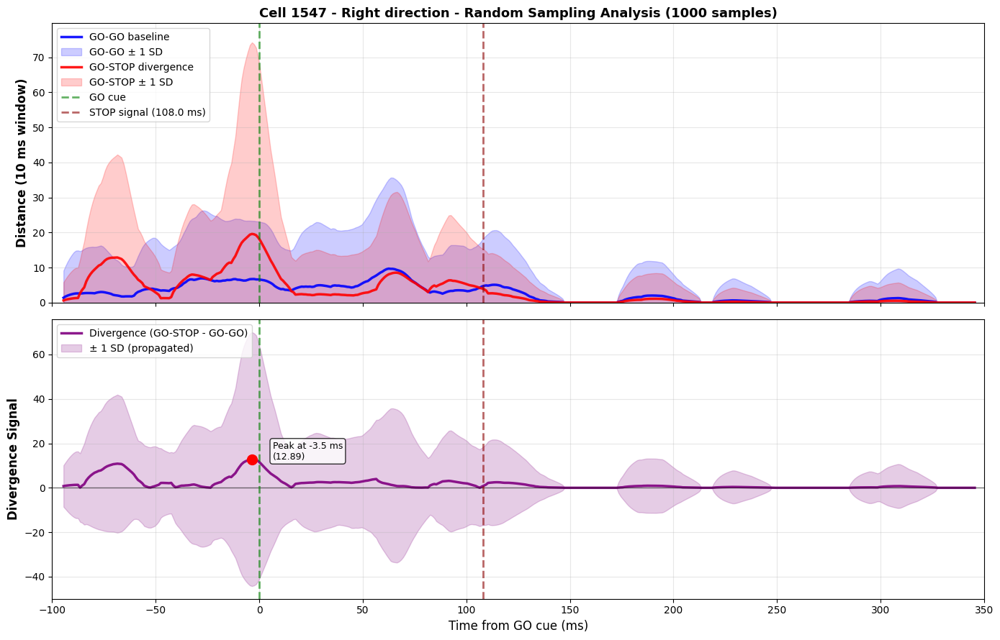


Peak divergence at -3.5 ms
Time from STOP signal to peak divergence: -111.5 ms


In [29]:
# Visualize GO-GO baseline vs GO-STOP divergence
fig, axes = plt.subplots(2, 1, figsize=(14, 9), sharex=True)

# Top panel: Both conditions with confidence intervals
ax1 = axes[0]

# GO-GO baseline
ax1.plot(time_centers, go_go_mean, 'b-', linewidth=2.5, label='GO-GO baseline', alpha=0.9)
ax1.fill_between(time_centers, 
                  go_go_mean - go_go_std, 
                  go_go_mean + go_go_std, 
                  color='blue', alpha=0.2, label='GO-GO ± 1 SD')

# GO-STOP divergence
ax1.plot(time_centers, go_stop_mean, 'r-', linewidth=2.5, label='GO-STOP divergence', alpha=0.9)
ax1.fill_between(time_centers, 
                  go_stop_mean - go_stop_std, 
                  go_stop_mean + go_stop_std, 
                  color='red', alpha=0.2, label='GO-STOP ± 1 SD')

# Event markers
ax1.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6, label='GO cue')
if not np.isnan(stop_signal_time):
    ax1.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, 
                alpha=0.6, label=f'STOP signal ({stop_signal_time:.1f} ms)')

ax1.set_ylabel(f'Distance ({window_size_ms} ms window)', fontsize=12, fontweight='bold')
ax1.set_title(f'Cell {example_cell_id} - {dir_map[DIRECTION]} direction - Random Sampling Analysis ({n_samples} samples)', 
              fontsize=13, fontweight='bold')
ax1.legend(loc='upper left', fontsize=10)
ax1.grid(alpha=0.3)
ax1.set_ylim(bottom=0)

# Bottom panel: Difference (GO-STOP - GO-GO)
ax2 = axes[1]
ax2.plot(time_centers, diff_mean, 'purple', linewidth=2.5, alpha=0.9, label='Divergence (GO-STOP - GO-GO)')
ax2.fill_between(time_centers, 
                  diff_mean - np.sqrt(go_go_std**2 + go_stop_std**2),  # Error propagation
                  diff_mean + np.sqrt(go_go_std**2 + go_stop_std**2), 
                  color='purple', alpha=0.2, label='± 1 SD (propagated)')
ax2.axhline(0, color='black', linestyle='-', linewidth=1, alpha=0.5)
ax2.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6)
if not np.isnan(stop_signal_time):
    ax2.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, alpha=0.6)

# Mark peak divergence
peak_div_idx = np.argmax(diff_mean)
peak_div_time = time_centers[peak_div_idx]
peak_div_value = diff_mean[peak_div_idx]
ax2.plot(peak_div_time, peak_div_value, 'ro', markersize=10, zorder=5)
ax2.text(peak_div_time + 10, peak_div_value, 
         f'Peak at {peak_div_time:.1f} ms\n({peak_div_value:.2f})',
         fontsize=9, bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

ax2.set_xlabel('Time from GO cue (ms)', fontsize=12)
ax2.set_ylabel('Divergence Signal', fontsize=12, fontweight='bold')
ax2.legend(loc='upper left', fontsize=10)
ax2.grid(alpha=0.3)

for ax in axes:
    ax.set_xlim(EPOK)

plt.tight_layout()
plt.show()

print(f"\nPeak divergence at {peak_div_time:.1f} ms")
if not np.isnan(stop_signal_time):
    print(f"Time from STOP signal to peak divergence: {peak_div_time - stop_signal_time:.1f} ms")

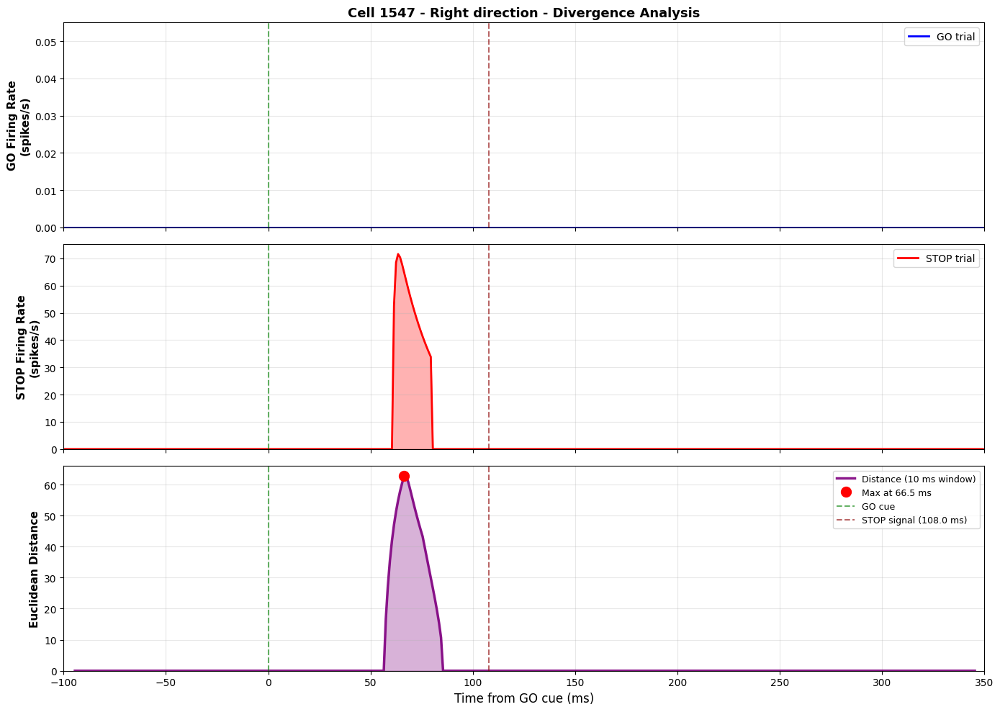


Timing Analysis:
GO cue: 0.0 ms
STOP signal: 108.0 ms
Time from GO cue to STOP signal: 108.0 ms

Maximum distance: 66.5 ms
Time from STOP signal to max distance: -41.5 ms


In [30]:
# Also plot the instantaneous difference (GO - STOP)
fig, axes = plt.subplots(3, 1, figsize=(14, 10), sharex=True)

# Top panel: GO SDF
ax1 = axes[0]
ax1.plot(t_go, sdf_go, 'b-', linewidth=2, label='GO trial')
ax1.fill_between(t_go, sdf_go, alpha=0.3, color='blue')
ax1.axvline(0, color='green', linestyle='--', linewidth=1.5, alpha=0.6)
if not np.isnan(stop_signal_time):
    ax1.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=1.5, alpha=0.6)
ax1.set_ylabel('GO Firing Rate\n(spikes/s)', fontsize=11, fontweight='bold')
ax1.set_title(f'Cell {example_cell_id} - {dir_map[DIRECTION]} direction - Divergence Analysis', 
              fontsize=13, fontweight='bold')
ax1.legend(loc='upper right')
ax1.grid(alpha=0.3)
ax1.set_ylim(bottom=0)

# Middle panel: STOP SDF
ax2 = axes[1]
ax2.plot(t_stop, sdf_stop, 'r-', linewidth=2, label='STOP trial')
ax2.fill_between(t_stop, sdf_stop, alpha=0.3, color='red')
ax2.axvline(0, color='green', linestyle='--', linewidth=1.5, alpha=0.6)
if not np.isnan(stop_signal_time):
    ax2.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=1.5, alpha=0.6)
ax2.set_ylabel('STOP Firing Rate\n(spikes/s)', fontsize=11, fontweight='bold')
ax2.legend(loc='upper right')
ax2.grid(alpha=0.3)
ax2.set_ylim(bottom=0)

# Bottom panel: Distance
ax3 = axes[2]
ax3.plot(window_centers_time, distances, 'purple', linewidth=2.5, alpha=0.9, label=f'Distance ({window_size_ms} ms window)')
ax3.fill_between(window_centers_time, distances, alpha=0.3, color='purple')
ax3.plot(max_dist_time, distances[max_dist_idx], 'ro', markersize=10, zorder=5, label=f'Max at {max_dist_time:.1f} ms')
ax3.axvline(0, color='green', linestyle='--', linewidth=1.5, alpha=0.6, label='GO cue')
if not np.isnan(stop_signal_time):
    ax3.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=1.5, alpha=0.6, label=f'STOP signal ({stop_signal_time:.1f} ms)')
ax3.set_xlabel('Time from GO cue (ms)', fontsize=12)
ax3.set_ylabel('Euclidean Distance', fontsize=11, fontweight='bold')
ax3.legend(loc='upper right', fontsize=9)
ax3.grid(alpha=0.3)
ax3.set_ylim(bottom=0)

# Set common x-axis limits
for ax in axes:
    ax.set_xlim(EPOK)

plt.tight_layout()
plt.show()

# Print timing analysis
print(f"\nTiming Analysis:")
print("=" * 60)
print(f"GO cue: 0.0 ms")
if not np.isnan(stop_signal_time):
    print(f"STOP signal: {stop_signal_time:.1f} ms")
    print(f"Time from GO cue to STOP signal: {stop_signal_time:.1f} ms")
print(f"\nMaximum distance: {max_dist_time:.1f} ms")
if not np.isnan(stop_signal_time):
    print(f"Time from STOP signal to max distance: {max_dist_time - stop_signal_time:.1f} ms")

## 11. Interactive Dashboard - Browse All Neurons

Use the interactive dashboard below to:
- Browse through all analyzed neurons
- Navigate with Previous/Next buttons
- Select specific neurons by ID
- View GO-GO vs GO-STOP divergence plots for each neuron

In [31]:
# ============================================================================
# INTERACTIVE PANEL DASHBOARD - Browse Neurons
# ============================================================================

import panel as pn
import matplotlib.pyplot as plt
import numpy as np
from cell_analysis import Cell

pn.extension()

# Get list of valid cell IDs from results
cell_ids = all_neuron_results['cell_ids']

# Direction mapping
dir_map = {0: 'Right', 180: 'Left'}

def get_neuron_data(cell_idx):
    """Get data for a specific neuron by index"""
    return {
        'cell_id': cell_ids[cell_idx],
        'go_go_mean': all_neuron_results['go_go_mean'][cell_idx],
        'go_go_std': all_neuron_results['go_go_std'][cell_idx],
        'go_stop_mean': all_neuron_results['go_stop_mean'][cell_idx],
        'go_stop_std': all_neuron_results['go_stop_std'][cell_idx],
        'divergence_mean': all_neuron_results['divergence_mean'][cell_idx],
        'peak_time': all_neuron_results['peak_divergence_time'][cell_idx],
        'peak_value': all_neuron_results['peak_divergence_value'][cell_idx]
    }

def plot_neuron(cell_idx, error_type='std'):
    """Create the visualization for a specific neuron"""
    # Get neuron data
    data = get_neuron_data(cell_idx)
    cell_id = data['cell_id']
    go_go_mean = data['go_go_mean']
    go_go_std = data['go_go_std']
    go_stop_mean = data['go_stop_mean']
    go_stop_std = data['go_stop_std']
    diff_mean = data['divergence_mean']

    
    # Calculate SEM if needed (std / sqrt(n_samples))
    if error_type == 'sem':
        go_go_error = go_go_std / np.sqrt(n_samples)
        go_stop_error = go_stop_std / np.sqrt(n_samples)
        error_label = 'SEM'
    else:
        go_go_error = go_go_std
        go_stop_error = go_stop_std
        error_label = 'SD'

    # Create Cell instance with session.data (filtered GO trials)
    cell_data = session.data[session.data['cell_ID'] == cell_id]
    cell = Cell(cell_data, verbose=False)

    # Calculate stop signal time (SSD) from stop_cue - go_cue
    stop_trials = cell_data[
        (cell_data['type'] == 'STOP') &
        (cell_data['dir'] == DIRECTION) &
        (cell_data['ssd_number'] == SSD_NUM)
    ]
    
    # Calculate stop signal time as stop_cue - go_cue
    if len(stop_trials) > 0 and 'stop_cue' in stop_trials.columns and 'go_cue' in stop_trials.columns:
        stop_signal_times = stop_trials['stop_cue'] - stop_trials['go_cue']
        stop_signal_time = stop_signal_times.mean()
    else:
        stop_signal_time = np.nan

    # Create figure with 3 rows
    fig, axes = plt.subplots(3, 1, figsize=(14, 6), sharex=True)

    # ========================================================================
    # Row 1: GO-GO baseline vs GO-STOP divergence
    # ========================================================================
    ax1 = axes[0]

    # GO-GO baseline
    ax1.plot(t_centers, go_go_mean, 'b-', linewidth=2.5, label='GO-GO baseline', alpha=0.9)
    ax1.fill_between(t_centers,
                      go_go_mean - go_go_error,
                      go_go_mean + go_go_error,
                      color='blue', alpha=0.2, label=f'GO-GO ± 1 {error_label}')

    # GO-STOP divergence
    ax1.plot(t_centers, go_stop_mean, 'r-', linewidth=2.5, label='GO-STOP divergence', alpha=0.9)
    ax1.fill_between(t_centers,
                      go_stop_mean - go_stop_error,
                      go_stop_mean + go_stop_error,
                      color='red', alpha=0.2, label=f'GO-STOP ± 1 {error_label}')

    # Event markers
    ax1.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6, label='GO cue')
    if not np.isnan(stop_signal_time):
        ax1.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2,
                    alpha=0.6, label=f'STOP signal ({stop_signal_time:.1f} ms)')

    ax1.set_ylabel(f'Distance ({window_size_ms} ms window)', fontsize=12, fontweight='bold')
    ax1.set_title(f'Cell {cell_id} (#{cell_idx+1}/{len(cell_ids)}) - {dir_map[DIRECTION]} direction - Random Sampling ({n_samples} samples)',
                  fontsize=13, fontweight='bold')
    ax1.legend(loc='upper left', fontsize=10)
    ax1.grid(alpha=0.3)
    ax1.set_ylim(bottom=0)

    # ========================================================================
    # Row 2: Difference (GO-STOP - GO-GO)
    # ========================================================================
    ax2 = axes[1]
    ax2.plot(t_centers, diff_mean, 'purple', linewidth=2.5, alpha=0.9, label='Divergence (GO-STOP - GO-GO)')
    ax2.fill_between(t_centers,
                      diff_mean - np.sqrt(go_go_error**2 + go_stop_error**2),
                      diff_mean + np.sqrt(go_go_error**2 + go_stop_error**2),
                      color='purple', alpha=0.2, label=f'± 1 {error_label} (propagated)')
    ax2.axhline(0, color='black', linestyle='-', linewidth=1, alpha=0.5)
    ax2.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6)
    if not np.isnan(stop_signal_time):
        ax2.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, alpha=0.6)

    # Mark peak divergence
    peak_idx_time = data['peak_time']
    peak_val = data['peak_value']
    ax2.plot(peak_idx_time, peak_val, 'o', color='darkviolet', markersize=10,
             label=f'Peak: {peak_val:.2f} at {peak_idx_time:.1f} ms', zorder=5)

    ax2.set_ylabel('Divergence', fontsize=12, fontweight='bold')
    ax2.set_title('GO-STOP vs GO-GO Difference', fontsize=12, fontweight='bold')
    ax2.legend(loc='upper left', fontsize=10)
    ax2.grid(alpha=0.3)

    # ========================================================================
    # Row 3: PSTHs - GO left/right and STOP SSDs left/right
    # ========================================================================
    ax3 = axes[2]
    
    # Plot GO trials for both directions
    for direction in [0, 180]:
        dir_label = 'Right' if direction == 0 else 'Left'
        color = '#1f77b4' if direction == 0 else '#ff7f0e'  # Blue for right, orange for left
        
        bin_centers, firing_rate, n_trials = cell.calculate_psth(
            epok=EPOK,
            bin_size=1,
            alignment_point='go_cue',
            trial_type='GO',
            direction=direction,
            success_only=True,
            smooth=True,
            smooth_ker_size=25,
            delta=False,
            normalize_bins=False
        )
        
        if bin_centers is not None:
            ax3.plot(bin_centers, firing_rate, color=color, linewidth=2, 
                    label=f'GO {dir_label} (n={n_trials})', alpha=0.9)
    
    # Plot STOP trials by SSD number for both directions
    stop_data = cell_data[cell_data['type'] == 'STOP']
    ssd_numbers = sorted(stop_data['ssd_number'].dropna().unique())
    
    # Color schemes for STOP SSDs
    ssd_colors_right = {1: '#2ca02c', 2: '#d62728', 3: '#9467bd', 4: '#8c564b'}  # Solid colors for right
    ssd_colors_left = {1: '#98df8a', 2: '#ff9896', 3: '#c5b0d5', 4: '#c49c94'}   # Lighter colors for left
    
    for ssd_num in [SSD_NUM]:
        for direction in [0, 180]:
            dir_label = 'Right' if direction == 0 else 'Left'
            colors = ssd_colors_right if direction == 0 else ssd_colors_left
            linestyle = '-' if direction == 0 else '--'
            
            bin_centers, firing_rate, n_trials = cell.calculate_psth(
                epok=EPOK,
                bin_size=1,
                alignment_point='go_cue',
                trial_type='STOP',
                direction=direction,
                ssd_number=ssd_num,
                success_only=True,
                smooth=True,
                smooth_ker_size=25,
                delta=False,
                normalize_bins=False
            )
            
            if bin_centers is not None and n_trials > 0:
                ax3.plot(bin_centers, firing_rate, color=colors.get(int(ssd_num), '#7f7f7f'),
                        linewidth=1.5, linestyle=linestyle,
                        label=f'STOP SSD{int(ssd_num)} {dir_label} (n={n_trials})', alpha=0.8)
    
    # Event markers
    ax3.axvline(0, color='green', linestyle='--', linewidth=2, alpha=0.6)
    if not np.isnan(stop_signal_time):
        ax3.axvline(stop_signal_time, color='darkred', linestyle='--', linewidth=2, alpha=0.6)
    
    ax3.set_xlabel('Time from GO cue (ms)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Firing Rate (spikes/s)', fontsize=12, fontweight='bold')
    ax3.set_title('PSTHs: GO and STOP trials by Direction and SSD', fontsize=12, fontweight='bold')
    ax3.legend(loc='upper right', fontsize=8, ncol=2)
    ax3.grid(alpha=0.3)

    plt.tight_layout()
    plt.close(fig)

    return fig

# ============================================================================
# Create Panel Dashboard
# ============================================================================

# Create widgets - use dictionary for options with cell_id as key
cell_options = {f'Cell {cid}': idx for idx, cid in enumerate(cell_ids)}

cell_selector = pn.widgets.Select(
    name='Select Neuron by ID',
    options=cell_options,
    value=0,
    width=200
)


# Add error type selector
error_type_selector = pn.widgets.RadioButtonGroup(
    name='Error Bars',
    options=['std', 'sem'],
    value='std',
    button_type='success'
)

prev_button = pn.widgets.Button(name='◀ Previous', button_type='primary', width=100)
next_button = pn.widgets.Button(name='Next ▶', button_type='primary', width=100)
info_text = pn.pane.Markdown(f"**Neuron 1 of {len(cell_ids)}** | Cell ID: {cell_ids[0]}", width=400)

# Create plot pane
plot_pane = pn.pane.Matplotlib(plot_neuron(0, 'std'), tight=True, sizing_mode='stretch_width')

def update_plot(event=None):
    """Update the plot when selection changes"""
    idx = cell_selector.value
    error_type = error_type_selector.value
    plot_pane.object = plot_neuron(idx, error_type)
    info_text.object = f"**Neuron {idx+1} of {len(cell_ids)}** | Cell ID: {cell_ids[idx]}"

def prev_neuron(event):
    """Go to previous neuron"""
    current = cell_selector.value
    if current > 0:
        cell_selector.value = current - 1
    else:
        cell_selector.value = len(cell_ids) - 1  # Wrap around

def next_neuron(event):
    """Go to next neuron"""
    current = cell_selector.value
    if current < len(cell_ids) - 1:
        cell_selector.value = current + 1
    else:
        cell_selector.value = 0  # Wrap around

# Connect callbacks
cell_selector.param.watch(update_plot, 'value')
error_type_selector.param.watch(update_plot, 'value')
prev_button.on_click(prev_neuron)
next_button.on_click(next_neuron)

# Create layout
controls = pn.Row(
    prev_button,
    next_button,
    cell_selector,
    error_type_selector,
    info_text,
    sizing_mode='stretch_width'
)

dashboard = pn.Column(
    "# 🧠 Single Cell Divergence Analysis - Interactive Browser",
    f"**Dataset:** {len(cell_ids)} neurons | **Direction:** {dir_map[DIRECTION]} | **SSD:** {SSD_NUM} | **Samples:** {n_samples}",
    controls,
    plot_pane,
    sizing_mode='stretch_width'
)

# Display the dashboard
dashboard


BokehModel(combine_events=True, render_bundle={'docs_json': {'be329622-9c52-4161-90e3-2108742322fb': {'version…

In [32]:
# ============================================================================
# Create Database of Aligned PSTHs
# ============================================================================

aligned_psth_data = []

# Iterate over all neurons
print("Generating database of aligned PSTHs...")
for idx, cell_id in tqdm(enumerate(cell_ids), total=len(cell_ids)):
    
    # Get metadata
    neuron_data = get_neuron_data(idx)
    peak_dvg_time = neuron_data['peak_time'] if not np.isnan(neuron_data['peak_time']) else 0
    
    # Create Cell instance
    cell_data = session.data[session.data['cell_ID'] == cell_id]
    cell = Cell(cell_data, verbose=False)
    
    # Calculate stop signal time (SSD) for this cell context
    # Usually SSD is constant per condition, but let's recalculate to be safe
    stop_trials = cell_data[
        (cell_data['type'] == 'STOP') &
        (cell_data['dir'] == DIRECTION) &
        (cell_data['ssd_number'] == SSD_NUM)
    ]
    
    if len(stop_trials) > 0 and 'stop_cue' in stop_trials.columns and 'go_cue' in stop_trials.columns:
        stop_signal_times = stop_trials['stop_cue'] - stop_trials['go_cue']
        ssd_mean = stop_signal_times.mean()
    else:
        ssd_mean = np.nan
        
    # Define time relative to peak divergence
    # Relative Time = (Time relative to GO) - Peak_Divergence_Time
    # So:
    # GO Cue (at 0 relative to GO) -> 0 - Peak_Divergence_Time
    # Stop Signal (at SSD relative to GO) -> SSD - Peak_Divergence_Time
    
    go_cue_aligned = 0 - peak_dvg_time
    stop_signal_aligned = ssd_mean - peak_dvg_time if not np.isnan(ssd_mean) else np.nan
    
    # --- GO Trials PSTH ---
    bin_centers_go, firing_rate_go, n_trials_go = cell.calculate_psth(
        epok=EPOK,
        bin_size=1,
        alignment_point='go_cue',
        trial_type='GO',
        direction=DIRECTION, # The direction used for divergence calculation
        success_only=True,
        smooth=True,
        smooth_ker_size=25,
        delta=False,
        normalize_bins=False
    )
    
    if bin_centers_go is not None:
        shifted_time_go = bin_centers_go - peak_dvg_time
        
        # Store GO entry
        aligned_psth_data.append({
            'cell_id': cell_id,
            'direction': DIRECTION,
            'direction_label': dir_map[DIRECTION],
            'trial_type': 'GO',
            'ssd_number': np.nan,
            'time': shifted_time_go,
            'firing_rate': firing_rate_go,
            'n_trials': n_trials_go,
            'peak_divergence_time_relative_to_go': peak_dvg_time,
            'go_cue_aligned_time': go_cue_aligned,
            'stop_signal_aligned_time': stop_signal_aligned
        })
        
    # --- STOP Trials PSTH ---
    bin_centers_stop, firing_rate_stop, n_trials_stop = cell.calculate_psth(
        epok=EPOK,
        bin_size=1,
        alignment_point='go_cue',
        trial_type='STOP',
        direction=DIRECTION,
        ssd_number=SSD_NUM,
        success_only=True,
        smooth=True,
        smooth_ker_size=25,
        delta=False,
        normalize_bins=False
    )
    
    if bin_centers_stop is not None:
        shifted_time_stop = bin_centers_stop - peak_dvg_time
        
        # Store STOP entry
        aligned_psth_data.append({
            'cell_id': cell_id,
            'direction': DIRECTION,
            'direction_label': dir_map[DIRECTION],
            'trial_type': 'STOP',
            'ssd_number': SSD_NUM,
            'time': shifted_time_stop,
            'firing_rate': firing_rate_stop,
            'n_trials': n_trials_stop,
            'peak_divergence_time_relative_to_go': peak_dvg_time,
            'go_cue_aligned_time': go_cue_aligned,
            'stop_signal_aligned_time': stop_signal_aligned
        })
        
    # --- CONT Trials PSTH ---
    bin_centers_cont, firing_rate_cont, n_trials_cont = cell.calculate_psth(
        epok=EPOK,
        bin_size=1,
        alignment_point='go_cue',
        trial_type='CONT',
        direction=DIRECTION,
        ssd_number=SSD_NUM,
        success_only=True, # Non-cancelled trials (Control)
        smooth=True,
        smooth_ker_size=25,
        delta=False,
        normalize_bins=False
    )
    
    if bin_centers_cont is not None:
        shifted_time_cont = bin_centers_cont - peak_dvg_time
        
        # Store CONT entry
        aligned_psth_data.append({
            'cell_id': cell_id,
            'direction': DIRECTION,
            'direction_label': dir_map[DIRECTION],
            'trial_type': 'CONT',
            'ssd_number': SSD_NUM,
            'time': shifted_time_cont,
            'firing_rate': firing_rate_cont,
            'n_trials': n_trials_cont,
            'peak_divergence_time_relative_to_go': peak_dvg_time,
            'go_cue_aligned_time': go_cue_aligned,
            'stop_signal_aligned_time': stop_signal_aligned
        })


# Create DataFrame
psth_database = pd.DataFrame(aligned_psth_data)

print(f"Database created successfully with {len(psth_database)} entries.")
psth_database.head()

Generating database of aligned PSTHs...


  0%|          | 0/2773 [00:00<?, ?it/s]

Database created successfully with 8319 entries.


,cell_id,direction,direction_label,trial_type,ssd_number,time,firing_rate,n_trials,peak_divergence_time_relative_to_go,go_cue_aligned_time,stop_signal_aligned_time
0,3,0,Right,GO,NaN,"[-302.5, -301.5, -300.5, -299.5, -298.5, -297....","[1.4892071284246535, 1.5020349264710404, 1.514...",198,202.5,-202.5,-70.5
1,3,0,Right,STOP,2.0,"[-302.5, -301.5, -300.5, -299.5, -298.5, -297....","[1.1660902031233462, 1.1664329586159705, 1.165...",15,202.5,-202.5,-70.5
2,3,0,Right,CONT,2.0,"[-302.5, -301.5, -300.5, -299.5, -298.5, -297....","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",21,202.5,-202.5,-70.5
3,7,0,Right,GO,NaN,"[-110.5, -109.5, -108.5, -107.5, -106.5, -105....","[1.7262827346498326, 1.731083300331295, 1.7357...",139,10.5,-10.5,121.5
4,7,0,Right,STOP,2.0,"[-110.5, -109.5, -108.5, -107.5, -106.5, -105....","[1.4582946119111293, 1.4169798532594, 1.375242...",13,10.5,-10.5,121.5


In [33]:
import panel as pn
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

pn.extension()

# 1. Prepare Data Options from psth_database
# ---------------------------------------------------------
if 'psth_database' not in locals() or psth_database.empty:
    print("Error: psth_database not found or empty. Please run the previous cell (Cell 36) first.")
else:
    # Get unique cells
    available_cells = sorted(psth_database['cell_id'].unique())
    
    # Get unique directions and create a mapping for the selector
    # We use a dictionary {Label: Value} for the Select widget
    dir_info = psth_database[['direction', 'direction_label']].drop_duplicates()
    dir_options = {row['direction_label']: row['direction'] for _, row in dir_info.iterrows()}
    
    # 2. Define Widgets
    # ---------------------------------------------------------
    cell_select = pn.widgets.Select(
        name='Neuron ID', 
        options=available_cells, 
        value=available_cells[0] if available_cells else None,
        width=150
    )
    
    dir_select = pn.widgets.Select(
        name='Direction', 
        options=dir_options, 
        value=list(dir_options.values())[0] if dir_options else None,
        width=150
    )
    
    # Navigation buttons
    prev_btn = pn.widgets.Button(name='◀ Prev', width=80)
    next_btn = pn.widgets.Button(name='Next ▶', width=80)
    
    # Info text
    info_pane = pn.pane.Markdown("", width=600)

    # 3. Define Interactions
    # ---------------------------------------------------------
    def update_stepper_buttons(event=None):
        """Handle previous/next button clicks based on sorted cell list."""
        current_idx = available_cells.index(cell_select.value)
        if event.obj.name == '◀ Prev':
            new_idx = (current_idx - 1) % len(available_cells)
        elif event.obj.name == 'Next ▶':
            new_idx = (current_idx + 1) % len(available_cells)
        cell_select.value = available_cells[new_idx]

    prev_btn.on_click(update_stepper_buttons)
    next_btn.on_click(update_stepper_buttons)

    # 4. Define Plotting Function
    # ---------------------------------------------------------
    @pn.depends(cell_select.param.value, dir_select.param.value)
    def plot_aligned_view(cell_id, direction):
        # Filter database
        cell_db_data = psth_database[
            (psth_database['cell_id'] == cell_id) & 
            (psth_database['direction'] == direction)
        ]
        
        if cell_db_data.empty:
            return pn.pane.Markdown(
                f"### ⚠️ No data available for Cell {cell_id} in this direction.\n"
                "The analysis might have been run for a different direction only.",
                style={'color': 'red'}
            )
        
        # Extract metadata (same for all rows of this cell/dir combo)
        meta = cell_db_data.iloc[0]
        direction_label = meta['direction_label']
        peak_div_time = meta['peak_divergence_time_relative_to_go']
        go_cue_aligned = meta['go_cue_aligned_time']
        stop_signal_aligned = meta['stop_signal_aligned_time']
        
        # Update info text
        info_str = (f"**Cell {cell_id}** | **{direction_label}**\n\n"
                    f"Peak Divergence: **{peak_div_time:.1f} ms** after GO cue")
        info_pane.object = info_str

        # Create Figure
        fig, ax = plt.subplots(figsize=(10, 3))
        
        # Plot GO trials
        go_rows = cell_db_data[cell_db_data['trial_type'] == 'GO']
        if not go_rows.empty:
            for _, row in go_rows.iterrows():
                label = f"GO {row['direction_label']} (n={row['n_trials']})"
                ax.plot(row['time'], row['firing_rate'], 
                        color='blue', linewidth=2.5, alpha=0.8, label=label)
        
        # Plot STOP trials
        stop_rows = cell_db_data[cell_db_data['trial_type'] == 'STOP']
        if not stop_rows.empty:
            for _, row in stop_rows.iterrows():
                label = f"STOP {row['direction_label']} SSD{int(row['ssd_number'])} (n={row['n_trials']})"
                ax.plot(row['time'], row['firing_rate'], 
                        color='red', linewidth=2.5, alpha=0.8, label=label)

        # Add Markers
        # 1. Peak Divergence (0 ms)
        ax.axvline(0, color='purple', linestyle='-', linewidth=2, label='Peak Divergence (0 ms)')
        
        # 2. GO Cue
        ax.axvline(go_cue_aligned, color='green', linestyle='--', linewidth=2, alpha=0.7, 
                   label=f'GO cue ({go_cue_aligned:.1f} ms)')
        
        # 3. STOP Signal
        if not np.isnan(stop_signal_aligned):
            ax.axvline(stop_signal_aligned, color='darkred', linestyle='--', linewidth=2, alpha=0.7, 
                       label=f'Mean STOP signal ({stop_signal_aligned:.1f} ms)')
            
        # Styling
        ax.set_xlabel('Time from Peak Divergence (ms)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Firing Rate (spikes/s)', fontsize=12, fontweight='bold')
        ax.set_title(f'Cell {cell_id} - {direction_label}: Aligned to Peak Divergence', 
                     fontsize=13, fontweight='bold')
        ax.legend(loc='upper right', fontsize=10, frameon=True)
        ax.grid(alpha=0.3)
        
        # Determine plot limits based on available data time
        # We can use EPOK logic relative to the peak time, or just let mpl scale it
        # Strict scaling to EPOK window shifted:
        if 'EPOK' in globals():
             ax.set_xlim([EPOK[0] - peak_div_time, EPOK[1] - peak_div_time])

        plt.tight_layout()
        plt.close(fig)
        
        return pn.pane.Matplotlib(fig, tight=True, sizing_mode='stretch_width')

    # 5. Layout Dashboard
    # ---------------------------------------------------------
    dashboard_aligned = pn.Column(
        pn.Row(pn.pane.Markdown("# 📉 Aligned PSTH Dashboard")),
        pn.Row(prev_btn, cell_select, next_btn, dir_select, align='center'),
        info_pane,
        plot_aligned_view,
        styles={'background': '#f4f4f4'},
        # width=600,
    )

    # Display
    dashboard_aligned

In [34]:
dashboard_aligned

BokehModel(combine_events=True, render_bundle={'docs_json': {'c4bbcfb0-80b3-4260-a014-02009dc1fa33': {'version…

Number of neurons included in average: 2773


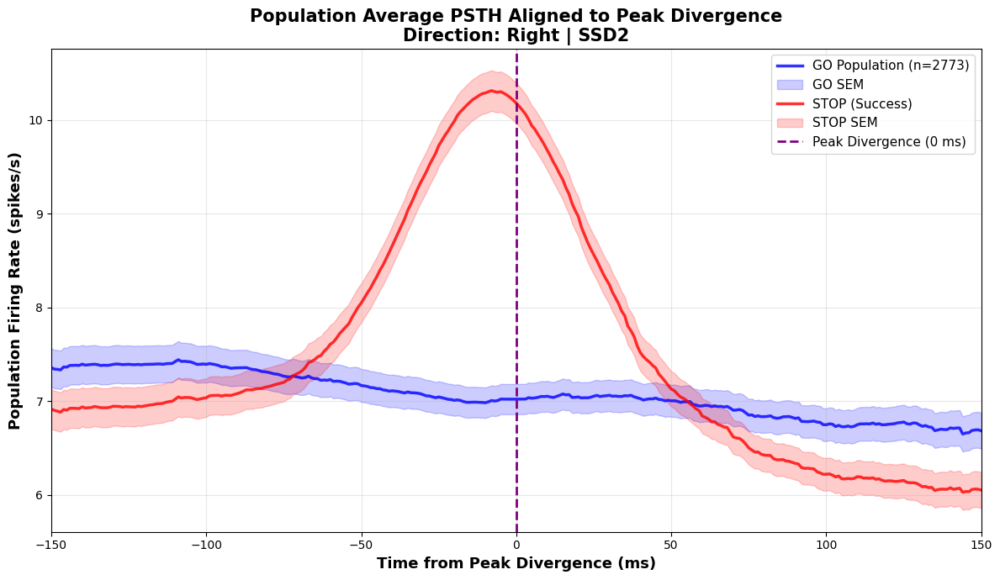

In [35]:
from scipy.interpolate import interp1d

# Define common time axis for population average (relative to Peak Divergence)
# Range: -150 to +150 ms around peak divergence ensures we capture the overlap
common_time = np.arange(-150, 151, 1)

def get_population_stats(df, trial_type, common_t):
    interpolated_rates = []
    
    # Filter for the specific trial type
    subset = df[df['trial_type'] == trial_type]
    
    for _, row in subset.iterrows():
        t = row['time']
        fr = row['firing_rate']
        
        # Create interpolator
        # bounds_error=False, fill_value=np.nan allows handling different time ranges due to shifting
        if len(t) > 1: # Basic check
            f = interp1d(t, fr, kind='linear', bounds_error=False, fill_value=np.nan)
            
            # Interpolate onto common axis
            fr_interp = f(common_t)
            interpolated_rates.append(fr_interp)
    
    if not interpolated_rates:
        return None, None, None
        
    # Stack into matrix: (n_neurons, n_timepoints)
    rate_matrix = np.vstack(interpolated_rates)
    
    # Compute mean and standard error, ignoring NaNs where data doesn't overlap
    with np.errstate(divide='ignore', invalid='ignore'):
        mean_rate = np.nanmean(rate_matrix, axis=0)
        std_rate = np.nanstd(rate_matrix, axis=0)
        n_valid = np.sum(~np.isnan(rate_matrix), axis=0)
        sem_rate = std_rate / np.sqrt(n_valid)
    
    return mean_rate, sem_rate, n_valid

# Calculate population statistics
go_mean, go_sem, go_n = get_population_stats(psth_database, 'GO', common_time)
stop_mean, stop_sem, stop_n = get_population_stats(psth_database, 'STOP', common_time)
cont_mean, cont_sem, cont_n = get_population_stats(psth_database, 'CONT', common_time)

# Plot the results
plt.figure(figsize=(12, 7))

# Plot GO
if go_mean is not None:
    plt.plot(common_time, go_mean, color='blue', label=f'GO Population (n={len(psth_database["cell_id"].unique())})', linewidth=2.5, alpha=0.8)
    plt.fill_between(common_time, go_mean - go_sem, go_mean + go_sem, color='blue', alpha=0.2, label='GO SEM')

# Plot STOP
if stop_mean is not None:
    plt.plot(common_time, stop_mean, color='red', label='STOP (Success)', linewidth=2.5, alpha=0.8)
    plt.fill_between(common_time, stop_mean - stop_sem, stop_mean + stop_sem, color='red', alpha=0.2, label='STOP SEM')

# Plot CONT (Failed Stop)
# if cont_mean is not None:
#     plt.plot(common_time, cont_mean, color='green', linestyle=':', label='CONT', linewidth=2.5, alpha=0.8)
#     plt.fill_between(common_time, cont_mean - cont_sem, cont_mean + cont_sem, color='green', alpha=0.15, label='CONT SEM')

# Add alignment marker
plt.axvline(0, color='purple', linestyle='--', linewidth=2, label='Peak Divergence (0 ms)')

plt.xlabel('Time from Peak Divergence (ms)', fontsize=13, fontweight='bold')
plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
plt.title(f'Population Average PSTH Aligned to Peak Divergence\nDirection: {dir_map[DIRECTION]} | SSD{SSD_NUM}', 
          fontsize=15, fontweight='bold')
plt.legend(loc='upper right', fontsize=11)
plt.grid(alpha=0.3)
plt.xlim(common_time[0], common_time[-1])

# Show number of neurons contributing at t=0
n_at_0 = np.max(go_n) if go_n is not None else 0
print(f"Number of neurons included in average: {n_at_0}")

plt.tight_layout()
plt.show()

Comparing GO vs STOP firing rates in window [-50, 50] ms aligned to peak divergence...

Statistical Results (n=2773 neurons):
Window: [-50, 50] ms relative to Peak Divergence
Mean GO Firing Rate: 7.08 ± 8.48 spks/s
Mean STOP Firing Rate: 9.15 ± 10.64 spks/s
Mean Difference (STOP - GO): 2.08 spks/s
------------------------------------------------------------
Paired t-test: t = 17.7204
P-value: 1.2068e-66
Cohen's d: 0.3366

Conclusion: Significant difference in firing rates.


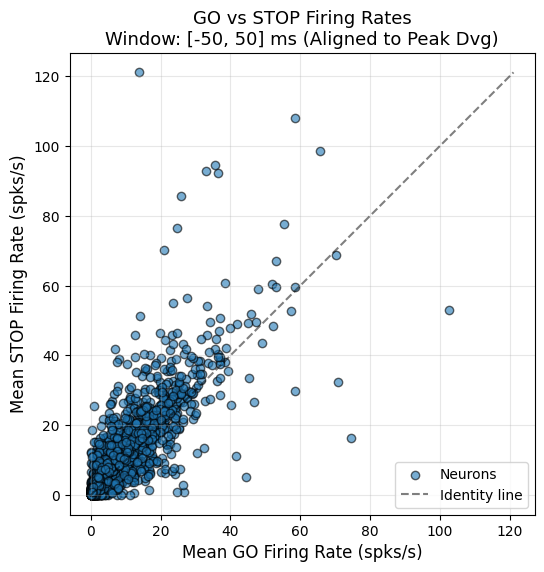

In [36]:
from scipy.stats import ttest_rel

# ============================================================================
# Statistical Comparison: GO vs STOP around Peak Divergence
# ============================================================================

# Define window for averaging
t_test_window = [-50, 50]

# Prepare lists to store paired means
go_means = []
stop_means = []
cell_ids_stats = []

print(f"Comparing GO vs STOP firing rates in window {t_test_window} ms aligned to peak divergence...")

# Iterate through unique neurons in the database
unique_cells = psth_database['cell_id'].unique()

for cell_id in unique_cells:
    # Get data for this cell (filtered by direction which is implicit in the db creation)
    cell_data = psth_database[psth_database['cell_id'] == cell_id]
    
    # Get GO trace
    go_row = cell_data[cell_data['trial_type'] == 'GO']
    if go_row.empty:
        continue
    go_time = go_row.iloc[0]['time']
    go_rate = go_row.iloc[0]['firing_rate']
    
    # Get STOP trace
    stop_row = cell_data[cell_data['trial_type'] == 'STOP']
    if stop_row.empty:
        continue
    stop_time = stop_row.iloc[0]['time']
    stop_rate = stop_row.iloc[0]['firing_rate']
    
    # Calculate mean rate in window
    # Create masks
    go_mask = (go_time >= t_test_window[0]) & (go_time <= t_test_window[1])
    stop_mask = (stop_time >= t_test_window[0]) & (stop_time <= t_test_window[1])
    
    # Check if we have data in this window
    if np.sum(go_mask) > 0 and np.sum(stop_mask) > 0:
        mean_go = np.mean(go_rate[go_mask])
        mean_stop = np.mean(stop_rate[stop_mask])
        
        go_means.append(mean_go)
        stop_means.append(mean_stop)
        cell_ids_stats.append(cell_id)

# Convert to arrays
go_means = np.array(go_means)
stop_means = np.array(stop_means)

# Perform Paired t-test
t_stat, p_val = ttest_rel(stop_means, go_means)

# Calculate effect size (Cohen's d for paired samples)
diff = stop_means - go_means
cohens_d = np.mean(diff) / np.std(diff)

print(f"\nStatistical Results (n={len(cell_ids_stats)} neurons):")
print("=" * 60)
print(f"Window: [{t_test_window[0]}, {t_test_window[1]}] ms relative to Peak Divergence")
print(f"Mean GO Firing Rate: {np.mean(go_means):.2f} ± {np.std(go_means):.2f} spks/s")
print(f"Mean STOP Firing Rate: {np.mean(stop_means):.2f} ± {np.std(stop_means):.2f} spks/s")
print(f"Mean Difference (STOP - GO): {np.mean(diff):.2f} spks/s")
print("-" * 60)
print(f"Paired t-test: t = {t_stat:.4f}")
print(f"P-value: {p_val:.4e}")
print(f"Cohen's d: {cohens_d:.4f}")

significance = "Significant" if p_val < 0.05 else "Not significant"
print(f"\nConclusion: {significance} difference in firing rates.")

# Visualization
plt.figure(figsize=(6, 6))
# Scatter plot
plt.scatter(go_means, stop_means, alpha=0.6, edgecolors='k', label='Neurons')
# Identity line
max_val = max(np.max(go_means), np.max(stop_means))
plt.plot([0, max_val], [0, max_val], 'k--', alpha=0.5, label='Identity line')

plt.xlabel('Mean GO Firing Rate (spks/s)', fontsize=12)
plt.ylabel('Mean STOP Firing Rate (spks/s)', fontsize=12)
plt.title(f'GO vs STOP Firing Rates\nWindow: {t_test_window} ms (Aligned to Peak Dvg)', fontsize=13)
plt.legend()
plt.grid(alpha=0.3)
plt.axis('equal')
plt.show()

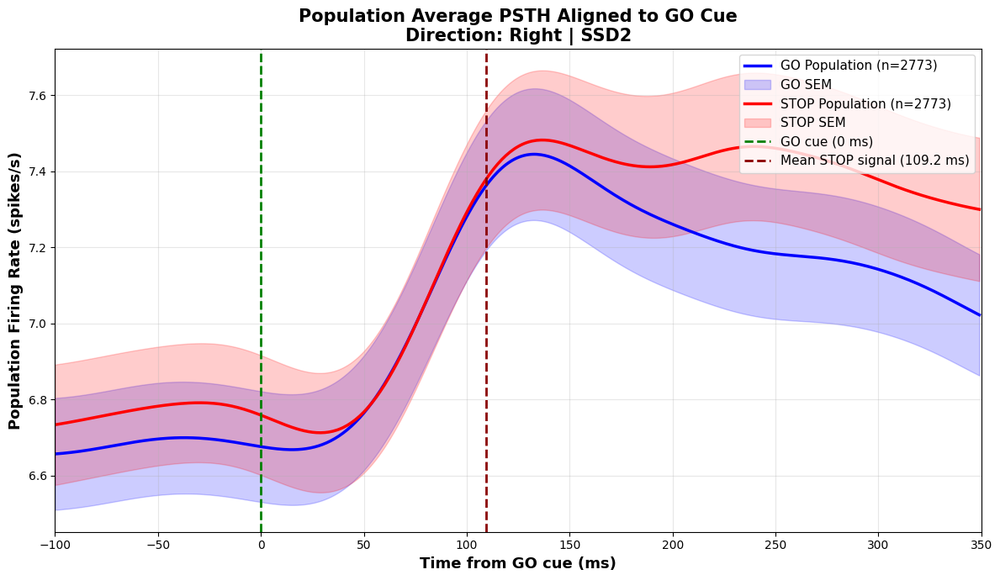

In [37]:
# ============================================================================
# Plot Population Average PSTH Aligned to GO Cue
# ============================================================================

# Use the psth_database created in the previous steps
# The data in psth_database contains 'firing_rate' arrays calculated relative to GO cue
# (before we shifted them for the Peak Divergence plot).
# We can simply average these arrays directly as they share the same time basis (EPOK).

def get_psth_stats_aligned_to_go(df, trial_type):
    """
    Extract firing rates for a given trial type and compute population statistics.
    Assumes all firing_rate arrays are on the same timebase (relative to GO cue).
    """
    subset = df[df['trial_type'] == trial_type]
    
    if subset.empty:
        return None, None, 0
    
    # Stack the firing rate arrays (n_neurons x n_timepoints)
    # calculating PSTH in cell_analysis uses fixed EPOK and bin_size, so lengths should match
    try:
        rate_matrix = np.vstack(subset['firing_rate'].values)
    except ValueError as e:
        print(f"Error stacking arrays: {e}")
        return None, None, 0
    
    mean_rate = np.nanmean(rate_matrix, axis=0)
    std_rate = np.nanstd(rate_matrix, axis=0)
    n_neurons = rate_matrix.shape[0]
    sem_rate = std_rate / np.sqrt(n_neurons)
    
    return mean_rate, sem_rate, n_neurons

# 1. Reconstruct the common time axis
# We take one entry and reverse the shift: time_aligned_to_go = time + peak_divergence_time
if not psth_database.empty:
    sample_row = psth_database.iloc[0]
    # The 'time' column is relative to peak divergence
    # 'peak_divergence_time_relative_to_go' allows us to shift back to GO alignment
    time_axis_go = sample_row['time'] + sample_row['peak_divergence_time_relative_to_go']
else:
    # Fallback to EPOK definition if db is empty
    time_axis_go = np.arange(EPOK[0], EPOK[1], 1)

# 2. Compute Statistics
go_mean_go, go_sem_go, n_go = get_psth_stats_aligned_to_go(psth_database, 'GO')
stop_mean_go, stop_sem_go, n_stop = get_psth_stats_aligned_to_go(psth_database, 'STOP')

# 3. Calculate mean SSD for plotting (using the session data)
stop_trials_subset = session.data[
    (session.data['type'] == 'STOP') & 
    (session.data['dir'] == DIRECTION) &
    (session.data['ssd_number'] == SSD_NUM) &
    (session.data['trial_failed'] == False)
]
mean_ssd_val = stop_trials_subset['ssd_len'].mean() if not stop_trials_subset.empty else np.nan


# 4. Plot
plt.figure(figsize=(12, 7))

# Plot GO Population
if go_mean_go is not None:
    plt.plot(time_axis_go, go_mean_go, color='blue', label=f'GO Population (n={n_go})', linewidth=2.5)
    plt.fill_between(time_axis_go, go_mean_go - go_sem_go, go_mean_go + go_sem_go, 
                     color='blue', alpha=0.2, label='GO SEM')

# Plot STOP Population
if stop_mean_go is not None:
    plt.plot(time_axis_go, stop_mean_go, color='red', label=f'STOP Population (n={n_stop})', linewidth=2.5)
    plt.fill_between(time_axis_go, stop_mean_go - stop_sem_go, stop_mean_go + stop_sem_go, 
                     color='red', alpha=0.2, label='STOP SEM')

# Add Event Markers
plt.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue (0 ms)')

if not np.isnan(mean_ssd_val):
    plt.axvline(mean_ssd_val, color='darkred', linestyle='--', linewidth=2, 
                label=f'Mean STOP signal ({mean_ssd_val:.1f} ms)')

# Styling
plt.xlabel('Time from GO cue (ms)', fontsize=13, fontweight='bold')
plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
plt.title(f'Population Average PSTH Aligned to GO Cue\nDirection: {dir_map[DIRECTION]} | SSD{SSD_NUM}', 
          fontsize=15, fontweight='bold')
plt.legend(loc='upper right', fontsize=11)
plt.grid(alpha=0.3)
plt.xlim(EPOK[0], EPOK[1])

plt.tight_layout()
plt.show()

Aligning to STOP cue (Mean SSD = 109.2 ms)


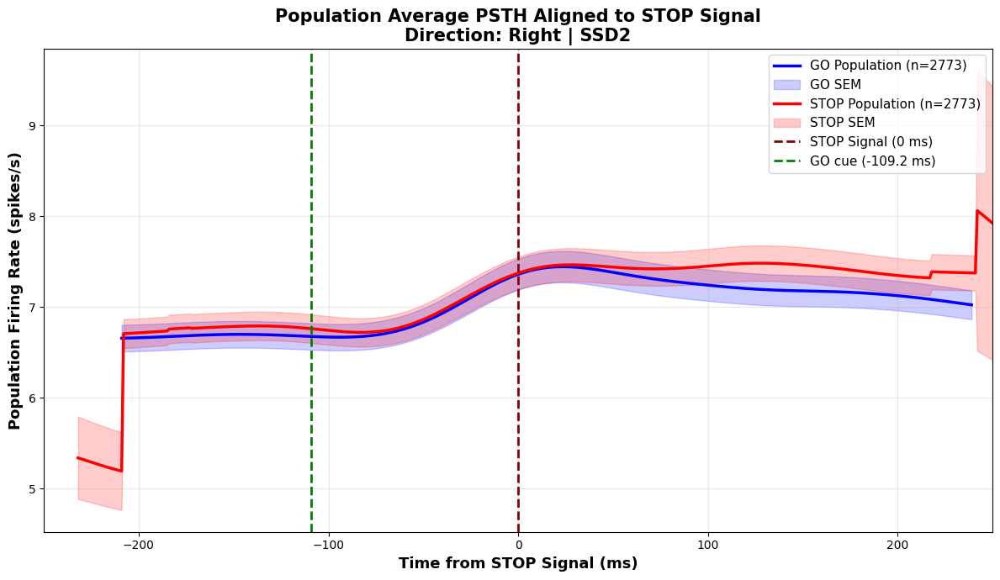

In [38]:
# ============================================================================
# Plot Population Average PSTH Aligned to STOP Cue (Virtual for GO)
# ============================================================================

def get_psth_stats_aligned_to_stop(df, trial_type, mean_ssd_val, common_window=[-200, 200]):
    """
    Extract firing rates and align them to STOP signal.
    For STOP trials: Signal is at stop_cue - go_cue.
    For GO trials: Virtual signal is at mean_ssd_val.
    
    The raw data in psth_database['firing_rate'] is aligned to GO cue [-50, 300] ms (EPOK).
    We need to shift each trace so that the alignment point becomes t=0.
    """
    interpolated_rates = []
    
    # Define common time axis for result
    common_t = np.arange(common_window[0], common_window[1] + 1, 1)
    
    subset = df[df['trial_type'] == trial_type]
    
    # We will use the original time vectors relative to GO.
    # We can reconstruct them using the metadata in psth_database.
    
    for _, row in subset.iterrows():
        # Reconstruct time axis relative to GO (as done in Cell 51)
        t_go = row['time'] + row['peak_divergence_time_relative_to_go']
        fr = row['firing_rate']
        
        # Determine alignment point relative to GO
        if trial_type == 'STOP':
            # Use actual SSD for this session/context (stop_signal_aligned_time + peak_div_time)
            # Or simplified: row['stop_signal_aligned_time'] refers to (ssd - peak). 
            # So ssd = row['stop_signal_aligned_time'] + row['peak_divergence_time_relative_to_go']
            if np.isnan(row['stop_signal_aligned_time']):
                alignment_point = mean_ssd_val # Fallback
            else:
                alignment_point = row['stop_signal_aligned_time'] + row['peak_divergence_time_relative_to_go']
        else:
            # GO trials: use mean SSD
            alignment_point = mean_ssd_val
            
        # Shift time axis: t_new = t_go - alignment_point
        t_shifted = t_go - alignment_point
        
        # Interpolate onto common axis
        if len(t_shifted) > 1:
            f = interp1d(t_shifted, fr, kind='linear', bounds_error=False, fill_value=np.nan)
            fr_interp = f(common_t)
            interpolated_rates.append(fr_interp)
            
    if not interpolated_rates:
        return None, None, 0, common_t

    # Stack and Compute Stats
    rate_matrix = np.vstack(interpolated_rates)
    
    with np.errstate(divide='ignore', invalid='ignore'):
        mean_rate = np.nanmean(rate_matrix, axis=0)
        std_rate = np.nanstd(rate_matrix, axis=0)
        n_valid = np.sum(~np.isnan(rate_matrix), axis=0)
        sem_rate = std_rate / np.sqrt(n_valid)
        
    return mean_rate, sem_rate, n_valid, common_t

# 1. Get mean SSD value (already calculated in Cell 51, but ensures availability)
if 'mean_ssd_val' not in locals() or np.isnan(mean_ssd_val):
     # Fallback calculation if variable missing
    stop_trials_subset = session.data[
        (session.data['type'] == 'STOP') & 
        (session.data['dir'] == DIRECTION) &
        (session.data['ssd_number'] == SSD_NUM) &
        (session.data['trial_failed'] == False)
    ]
    mean_ssd_val = stop_trials_subset['ssd_len'].mean()

print(f"Aligning to STOP cue (Mean SSD = {mean_ssd_val:.1f} ms)")

# 2. Compute Statistics (Window: -250 to +250 ms around STOP)
window = [-250, 250]
go_mean_stop, go_sem_stop, go_n_stop, time_axis_stop = get_psth_stats_aligned_to_stop(
    psth_database, 'GO', mean_ssd_val, common_window=window
)
stop_mean_stop, stop_sem_stop, stop_n_stop, _ = get_psth_stats_aligned_to_stop(
    psth_database, 'STOP', mean_ssd_val, common_window=window
)
window = [-250, 250]
go_mean_stop, go_sem_stop, go_n_stop, time_axis_stop = get_psth_stats_aligned_to_stop(
    psth_database, 'GO', mean_ssd_val, common_window=window
)
stop_mean_stop, stop_sem_stop, stop_n_stop, _ = get_psth_stats_aligned_to_stop(
    psth_database, 'STOP', mean_ssd_val, common_window=window
)

# 3. Plot
plt.figure(figsize=(12, 7))

# Plot GO Population
if go_mean_stop is not None:
    # Use max n for label
    n_display = np.max(go_n_stop) if isinstance(go_n_stop, np.ndarray) else 0
    plt.plot(time_axis_stop, go_mean_stop, color='blue', label=f'GO Population (n={n_display})', linewidth=2.5)
    plt.fill_between(time_axis_stop, go_mean_stop - go_sem_stop, go_mean_stop + go_sem_stop, 
                     color='blue', alpha=0.2, label='GO SEM')

# Plot STOP Population
if stop_mean_stop is not None:
    n_display = np.max(stop_n_stop) if isinstance(stop_n_stop, np.ndarray) else 0
    plt.plot(time_axis_stop, stop_mean_stop, color='red', label=f'STOP Population (n={n_display})', linewidth=2.5)
    plt.fill_between(time_axis_stop, stop_mean_stop - stop_sem_stop, stop_mean_stop + stop_sem_stop, 
                     color='red', alpha=0.2, label='STOP SEM')

# Add Event Markers
plt.axvline(0, color='darkred', linestyle='--', linewidth=2, label='STOP Signal (0 ms)')
plt.axvline(-mean_ssd_val, color='green', linestyle='--', linewidth=2, label=f'GO cue ({-mean_ssd_val:.1f} ms)')

# Styling
plt.xlabel('Time from STOP Signal (ms)', fontsize=13, fontweight='bold')
plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
plt.title(f'Population Average PSTH Aligned to STOP Signal\nDirection: {dir_map[DIRECTION]} | SSD{SSD_NUM}', 
          fontsize=15, fontweight='bold')
plt.legend(loc='upper right', fontsize=11)
plt.grid(alpha=0.3)
plt.xlim(window[0], window[1])

plt.tight_layout()
plt.show()

In [39]:
len(cell_ids)

2773

Running split-half analysis on GO trials...


  0%|          | 0/2773 [00:00<?, ?it/s]

Split-half analysis completed for 2773 neurons.


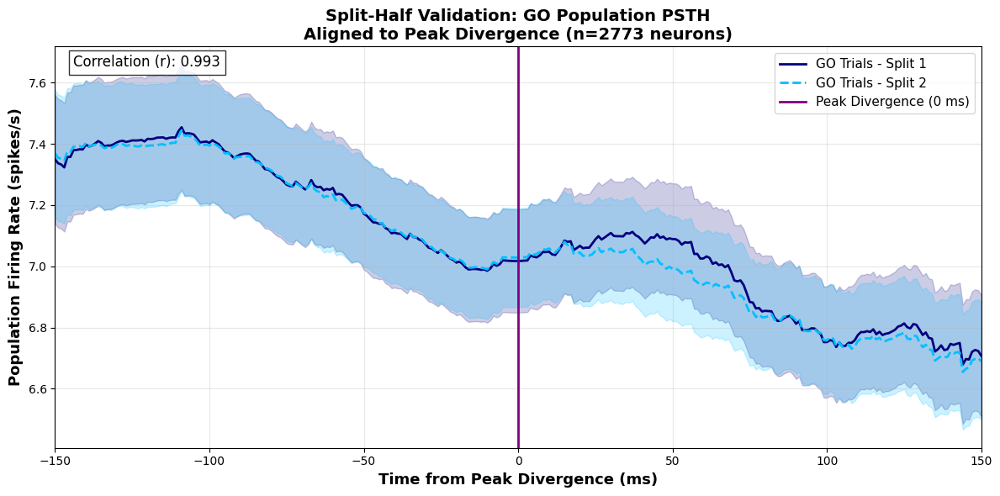

In [40]:
from scipy.interpolate import interp1d

# ============================================================================
# Split-Half Analysis of GO Trials (Internal Validation)
# ============================================================================
# Check consistency of GO responses when aligned to peak divergence time


# Parameters
common_time = np.arange(-150, 151, 1)  # Window around peak divergence
interpolated_rates_h1 = []
interpolated_rates_h2 = []

print("Running split-half analysis on GO trials...")

# Iterate over all valid neurons
for idx, cell_id in tqdm(enumerate(cell_ids), total=len(cell_ids)):
    
    # 1. Get Peak Divergence Time for this neuron
    peak_time_val = all_neuron_results['peak_divergence_time'][idx]
    if np.isnan(peak_time_val):
        continue

    # 2. Get Data for this neuron
    cell_df = session.data[session.data['cell_ID'] == cell_id]
    
    # 3. Filter specific GO trials used in analysis
    # (Same criteria: GO, specific Direction, Success)
    go_trials_df = cell_df[
        (cell_df['type'] == 'GO') & 
        (cell_df['dir'] == DIRECTION) & 
        (cell_df['trial_failed'] == False)
    ]
    
    # 4. Split trials into two halves
    unique_trials = go_trials_df['trial_number'].unique()
    
    # Skipping neurons with too few trials for a split
    if len(unique_trials) < 4: 
        continue
        
    np.random.seed(42 + idx) # Deterministic split for reproducibility
    np.random.shuffle(unique_trials)
    
    # split_idx = len(unique_trials) // 2
    split_idx = 17
    trials_h1 = unique_trials[:split_idx]
    trials_h2 = unique_trials[split_idx:]
    
    # 5. Create temporary Cell objects for each half
    # We pass the full cell_df but we will rely on the fact that calculate_psth
    # filters by direction/type. To enforce the specific trial list, we
    # pre-filter the dataframe passed to the Cell constructor.
    
    # Note: Cell constructor expects a DF with relevant columns.
    df_h1 = cell_df[cell_df['trial_number'].isin(trials_h1)]
    df_h2 = cell_df[cell_df['trial_number'].isin(trials_h2)]
    
    cell_h1 = Cell(df_h1, verbose=False)
    cell_h2 = Cell(df_h2, verbose=False)
    
    # 6. Calculate PSTHs
    # We use the standard params used throughout the notebook
    try:
        # Half 1
        t1, fr1, _ = cell_h1.calculate_psth(
            epok=EPOK, bin_size=1, alignment_point='go_cue',
            trial_type='GO', direction=DIRECTION, success_only=True,
            smooth=True, smooth_ker_size=25
        )
        
        # Half 2
        t2, fr2, _ = cell_h2.calculate_psth(
            epok=EPOK, bin_size=1, alignment_point='go_cue',
            trial_type='GO', direction=DIRECTION, success_only=True,
            smooth=True, smooth_ker_size=25
        )
        
        # 7. Align and Interpolate onto common axis
        if t1 is not None and t2 is not None:
            # Shift time axes by peak divergence time
            t1_shifted = t1 - peak_time_val
            t2_shifted = t2 - peak_time_val
            
            # Interpolate H1
            f1 = interp1d(t1_shifted, fr1, kind='linear', bounds_error=False, fill_value=np.nan)
            interpolated_rates_h1.append(f1(common_time))
            
            # Interpolate H2
            f2 = interp1d(t2_shifted, fr2, kind='linear', bounds_error=False, fill_value=np.nan)
            interpolated_rates_h2.append(f2(common_time))
            
    except Exception as e:
        # Catch potential errors (e.g. alignment issues)
        continue

# 8. Compute Population Statistics
def compute_stats(rate_list):
    matrix = np.vstack(rate_list)
    with np.errstate(divide='ignore', invalid='ignore'):
        mean = np.nanmean(matrix, axis=0)
        std = np.nanstd(matrix, axis=0)
        n = np.sum(~np.isnan(matrix), axis=0)
        sem = std / np.sqrt(n)
    return mean, sem

mean1, sem1 = compute_stats(interpolated_rates_h1)
mean2, sem2 = compute_stats(interpolated_rates_h2)
n_neurons_split = len(interpolated_rates_h1)

print(f"Split-half analysis completed for {n_neurons_split} neurons.")

# 9. Plot
plt.figure(figsize=(12, 6))

plt.plot(common_time, mean1, color='navy', label='GO Trials - Split 1', linewidth=2)
plt.fill_between(common_time, mean1 - sem1, mean1 + sem1, color='navy', alpha=0.2)

plt.plot(common_time, mean2, color='deepskyblue', label='GO Trials - Split 2', linewidth=2, linestyle='--')
plt.fill_between(common_time, mean2 - sem2, mean2 + sem2, color='deepskyblue', alpha=0.2)

plt.axvline(0, color='purple', linestyle='-', linewidth=2, label='Peak Divergence (0 ms)')

plt.xlabel('Time from Peak Divergence (ms)', fontsize=13, fontweight='bold')
plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
plt.title(f'Split-Half Validation: GO Population PSTH\nAligned to Peak Divergence (n={n_neurons_split} neurons)', 
          fontsize=14, fontweight='bold')
plt.legend(loc='upper right', fontsize=11)
plt.grid(alpha=0.3)
plt.xlim(common_time[0], common_time[-1])

# Calculate correlation between the two halves
valid_mask = ~np.isnan(mean1) & ~np.isnan(mean2)
corr = np.corrcoef(mean1[valid_mask], mean2[valid_mask])[0, 1]
plt.text(0.02, 0.95, f'Correlation (r): {corr:.3f}', transform=plt.gca().transAxes, 
         fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

In [41]:
# get_neuron_data

all_neuron_results.keys()
divergence_mean = all_neuron_results['divergence_mean']
divergence_std = np.sqrt(all_neuron_results['go_stop_std']**2 + all_neuron_results['go_go_std']**2)

divergence_mean.shape # (#neurons = 58, timepoints = 300)

go_period_mean_divergence = divergence_mean[:, :int(mean_ssd) + 1].mean(axis=1)
go_period_mean_std = divergence_std[:, :int(mean_ssd) + 1].mean(axis=1)

stop_period_mean_divergence = divergence_mean[:, int(mean_ssd) + 1:].mean(axis=1)
stop_period_mean_std = divergence_std[:, int(mean_ssd) + 1:].mean(axis=1)

go_period_mean_divergence.shape, go_period_mean_std.shape, stop_period_mean_divergence.shape, stop_period_mean_std.shape


((2773,), (2773,), (2773,), (2773,))

In [42]:
df = pd.DataFrame({
    'cell_id': all_neuron_results['cell_ids'],
    'go_period_mean_divergence': go_period_mean_divergence,
    'go_period_std': go_period_mean_std,
    'stop_period_mean_divergence': stop_period_mean_divergence,
    'stop_period_std': stop_period_mean_std
})

# df.hvplot.parallel_coordinates()

In [43]:
import holoviews as hv
import hvplot.pandas  # noqa

# Select relevant columns for the plot
# We include std columns here to use them later
plot_df = df[['cell_id', 'go_period_mean_divergence', 'stop_period_mean_divergence', 'go_period_std', 'stop_period_std']].copy()
plot_df['cell_id'] = plot_df['cell_id'].astype(str)

# 1. Melt the Mean values
df_means = plot_df.melt(
    id_vars='cell_id', 
    value_vars=['go_period_mean_divergence', 'stop_period_mean_divergence'],
    var_name='Period_Col', 
    value_name='Mean_Divergence'
)

# Map the column names to cleaner labels for the x-axis
period_map = {
    'go_period_mean_divergence': 'GO Period',
    'stop_period_mean_divergence': 'STOP Period'
}
df_means['Period'] = df_means['Period_Col'].map(period_map)

# 2. Melt the Std values
df_stds = plot_df.melt(
    id_vars='cell_id', 
    value_vars=['go_period_std', 'stop_period_std'],
    var_name='Std_Col', 
    value_name='Std_Divergence'
)
# We need to align the Std rows with the Mean rows. 
# The order is preserved by melt, but explicit mapping helps safety.
std_map = {
    'go_period_std': 'GO Period',
    'stop_period_std': 'STOP Period'
}
df_stds['Period'] = df_stds['Std_Col'].map(std_map)

# 3. Merge them
merged_plot_df = pd.merge(df_means, df_stds[['cell_id', 'Period', 'Std_Divergence']], on=['cell_id', 'Period'])

# 4. Create the base line plot (Parallel Coordinates style)
lines = merged_plot_df.hvplot.line(
    x='Period', 
    y='Mean_Divergence', 
    by='cell_id', 
    title='Divergence: GO Period vs STOP Period (with SD)',
    alpha=0.6,
    legend=False,
    height=500,
    width=700,
    cmap='Category10',
    xlabel='Time Period',
    ylabel='Mean Divergence'
)

# 5. Create Error Bars
# We need to calculate y error: (Mean - Std, Mean + Std) is often handled by ErrorBars directly if given yerr
# hv.ErrorBars takes (x, y, yerr_min, yerr_max) or just (x, y, yerr)
# Here we construct points with errors
error_bars = hv.ErrorBars(
    merged_plot_df, 
    kdims=['Period', 'Mean_Divergence'], 
    vdims=['Std_Divergence']
).opts(color='gray', alpha=0.5)

# 6. Scatter needed to show the points clearly
scatter = merged_plot_df.hvplot.scatter(
    x='Period', 
    y='Mean_Divergence', 
    by='cell_id', 
    color='black',
    alpha=0.6,
    legend=False
)

# Combine everything
final_plot = (lines  * scatter).opts(
    toolbar='above'
)

final_plot

:Overlay
   .NdOverlay.I  :NdOverlay   [cell_id]
      :Curve   [Period]   (Mean_Divergence)
   .NdOverlay.II :NdOverlay   [cell_id]
      :Scatter   [Period]   (Mean_Divergence)

In [44]:
import json

# Read notebook file
with open('/home/barak/Projects/population-analysis/population_analysis/trajectory_divergence/single_cell_divergence_analysis.ipynb', 'r') as f:
    nb = json.load(f)

# Get overview of notebook structure
print(f"Number of cells: {len(nb['cells'])}")
print(f"\nCell types:")
cell_types = {}
for cell in nb['cells']:
    ct = cell['cell_type']
    cell_types[ct] = cell_types.get(ct, 0) + 1
print(cell_types)

# List all markdown headers and code cell first lines
print("\n=== NOTEBOOK STRUCTURE ===\n")
for i, cell in enumerate(nb['cells']):
    if cell['cell_type'] == 'markdown':
        source = ''.join(cell['source'])
        # Get first line if it's a header
        first_line = source.strip().split('\n')[0] if source.strip() else ''
        if first_line.startswith('#'):
            print(f"[{i}] MARKDOWN: {first_line}")
    elif cell['cell_type'] == 'code':
        source = ''.join(cell['source'])
        lines = [l for l in source.strip().split('\n') if l.strip() and not l.strip().startswith('#')]
        first_line = lines[0][:80] if lines else '(empty)'
        # Get any comments at the start
        all_lines = source.strip().split('\n')
        comment = all_lines[0] if all_lines and all_lines[0].strip().startswith('#') else None
        if comment:
            print(f"[{i}] CODE: {comment[:80]}")
        else:
            print(f"[{i}] CODE: {first_line}")

Number of cells: 68

Cell types:
{'markdown': 16, 'code': 52}

=== NOTEBOOK STRUCTURE ===

[0] MARKDOWN: # Cell Trajectory Divergence Analysis
[1] CODE: import pandas as pd
[2] MARKDOWN: ## 1. Load Data, instantiate session and populate variables
[3] MARKDOWN: ### 1.A Variables and Parameters
[4] CODE: base_path = Path.cwd().parents[1] / 'data' / 'unified_cell_trial_data'
[5] MARKDOWN: ### 1.B get instances
[6] CODE: # Load MSN cell database
[7] CODE: # leave only tunned cells in the DF
[8] CODE: # # Load synthetic session data
[9] MARKDOWN: ### 1.C Clean data
[10] CODE: session.data.columns
[11] CODE: def is_go_trial_with_valid_saccade(row, mean_ssd):
[12] MARKDOWN: ## 2. Check Trial Counts
[13] CODE: # Count successful trials for GO and STOP SSD2 by direction
[14] MARKDOWN: ## 3. Create Trial Number Lists
[15] CODE: def filter_trials(session_data, trial_type, direction, ssd_number=None, success_
[16] MARKDOWN: ## 4. Neuron Distribution per Trial
[17] CODE: # Parameters for analysis
[

In [45]:
# Read specific code cells in more detail
import json

with open('/home/barak/Projects/population-analysis/population_analysis/trajectory_divergence/single_cell_divergence_analysis.ipynb', 'r') as f:
    nb = json.load(f)

# Read cells 11, 15, 25, 26, 30, 33 - the main function definitions
cells_of_interest = [11, 15, 25, 26, 30, 33]

for idx in cells_of_interest:
    cell = nb['cells'][idx]
    source = ''.join(cell['source'])
    print(f"\n{'='*80}")
    print(f"CELL [{idx}]:")
    print('='*80)
    print(source[:2000] if len(source) > 2000 else source)


CELL [11]:
def is_go_trial_with_valid_saccade(row, mean_ssd):
    if (row['type'] != 'GO'):
        return True
    if np.isnan(row['first_relevant_saccade']).any():
        return False
    saccade_onset = row['first_relevant_saccade'][0]
    return (saccade_onset - row['go_cue']) > (mean_ssd * 1.5)

oring_data = session.data.copy()
print(oring_data.shape)

stop_trials = session.data[
    (session.data['type'] == 'STOP') & 
    (session.data['trial_failed'] == False) & 
    (session.data['dir'] == DIRECTION) &
    (session.data['ssd_number'] == SSD_NUM)
]
mean_ssd = stop_trials['ssd_len'].mean()
print(f"Mean SSD length for successful STOP SSD{SSD_NUM} trials: {mean_ssd:.2f} ms")

# session.data[
#     ~session.data.apply(lambda row: is_go_trial_with_valid_saccade(row, mean_ssd), axis=1)
# ]["trial_number"].value_counts().shape

# Filter GO trials
session.data = session.data[
    session.data.apply(lambda row: is_go_trial_with_valid_saccade(row, mean_ssd), axis=1)
]

print(f"Number of

In [46]:
# Continue reading cells 39-57 - population analysis and dashboard
import json

with open('/home/barak/Projects/population-analysis/population_analysis/trajectory_divergence/single_cell_divergence_analysis.ipynb', 'r') as f:
    nb = json.load(f)

# Read cells 39, 40, 41, 46, 47, 48, 50, 51, 52
cells_of_interest = [39, 40, 41, 46, 47, 48, 50, 51, 52]

for idx in cells_of_interest:
    cell = nb['cells'][idx]
    source = ''.join(cell['source'])
    print(f"\n{'='*80}")
    print(f"CELL [{idx}]:")
    print('='*80)
    print(source[:2500] if len(source) > 2500 else source)


CELL [39]:
# ============================================================================
# PARALLEL PROCESSING - Analyze all valid neurons
# ============================================================================

from joblib import Parallel, delayed
from tqdm.notebook import tqdm
import numpy as np

def process_single_neuron_wrapper(i, cell_id, session_data, DIRECTION, SSD_NUM,
                                   n_samples, window_size_ms, EPOK, random_state):
    """
    Worker function to process a single neuron in parallel.
    """
    try:
        # Get data for this cell
        cell_data = session_data[session_data['cell_ID'] == cell_id]
        
        # Sample GO-GO pairs
        gg_dist, t_centers = sample_trial_pairs_distances(
            cell_data=cell_data,
            trial_type1='GO',
            trial_type2='GO',
            direction=DIRECTION,
            ssd_number=SSD_NUM,
            n_samples=n_samples,
            epoch=EPOK,
            window_size_ms=wi

In [47]:
# Read the last few cells 53-57
import json

with open('/home/barak/Projects/population-analysis/population_analysis/trajectory_divergence/single_cell_divergence_analysis.ipynb', 'r') as f:
    nb = json.load(f)

for idx in [53, 54, 55, 56, 57]:
    cell = nb['cells'][idx]
    source = ''.join(cell['source'])
    print(f"\n{'='*80}")
    print(f"CELL [{idx}]:")
    print('='*80)
    print(source[:2000] if len(source) > 2000 else source)


CELL [53]:
# ============================================================================
# Plot Population Average PSTH Aligned to STOP Cue (Virtual for GO)
# ============================================================================

def get_psth_stats_aligned_to_stop(df, trial_type, mean_ssd_val, common_window=[-200, 200]):
    """
    Extract firing rates and align them to STOP signal.
    For STOP trials: Signal is at stop_cue - go_cue.
    For GO trials: Virtual signal is at mean_ssd_val.
    
    The raw data in psth_database['firing_rate'] is aligned to GO cue [-50, 300] ms (EPOK).
    We need to shift each trace so that the alignment point becomes t=0.
    """
    interpolated_rates = []
    
    # Define common time axis for result
    common_t = np.arange(common_window[0], common_window[1] + 1, 1)
    
    subset = df[df['trial_type'] == trial_type]
    
    # We will use the original time vectors relative to GO.
    # We can reconstruct them using the metadata in psth_da

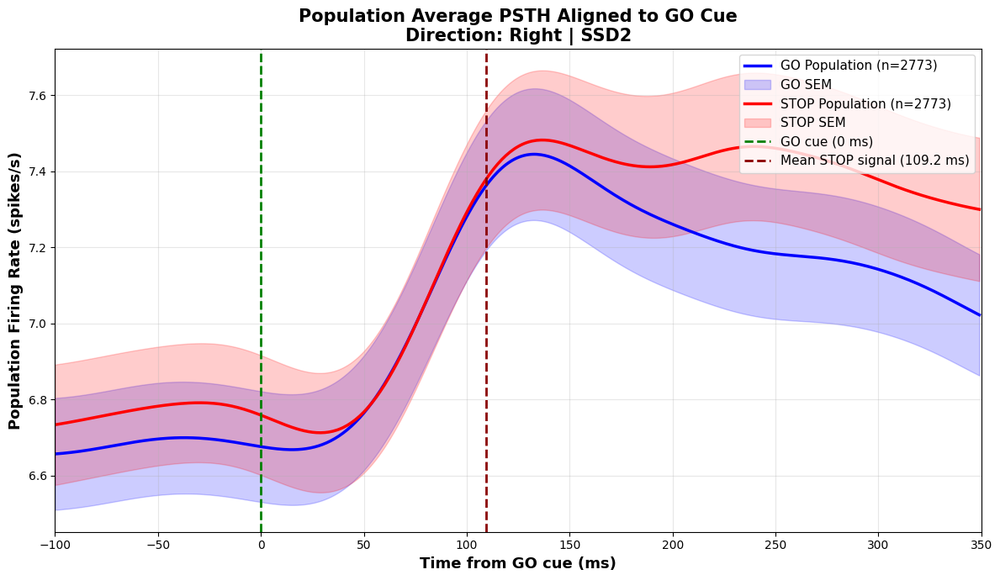

In [48]:
# Plot Population Average PSTH Aligned to GO Cue

def get_psth_stats_aligned_to_go(df, trial_type):
    """
    Extract firing rates for a given trial type and compute population statistics.
    Assumes all firing_rate arrays are on the same timebase (relative to GO cue).
    """
    if df is None or df.empty:
        return None, None, 0
        
    subset = df[df['trial_type'] == trial_type]
    
    if subset.empty:
        return None, None, 0
    
    # Stack the firing rate arrays (n_neurons x n_timepoints)
    try:
        rate_matrix = np.vstack(subset['firing_rate'].values)
    except ValueError as e:
        print(f"Error stacking arrays: {e}")
        return None, None, 0
        
    mean_rate = np.nanmean(rate_matrix, axis=0)
    std_rate = np.nanstd(rate_matrix, axis=0)
    n_neurons = rate_matrix.shape[0]
    sem_rate = std_rate / np.sqrt(n_neurons)
    
    return mean_rate, sem_rate, n_neurons

# Determine time axis
if 'psth_database' in locals() and not psth_database.empty:
    sample_row = psth_database.iloc[0]
    # The 'time' column is relative to peak divergence
    # 'peak_divergence_time_relative_to_go' allows us to shift back to GO alignment
    # Check if we have the necessary columns, otherwise fall back to EPOK
    if 'time' in sample_row and 'peak_divergence_time_relative_to_go' in sample_row:
        time_axis_go = sample_row['time'] + sample_row['peak_divergence_time_relative_to_go']
    else:
        # Fallback to reconstructing from EPOK parameters if available
        if 'EPOK' in locals():
            time_axis_go = np.arange(EPOK[0], EPOK[1], 1)
        else:
            print("Warning: Could not determine time axis. Using placeholder.")
            time_axis_go = np.arange(len(sample_row['firing_rate']))
            
    # Compute Statistics
    go_mean_go, go_sem_go, n_go = get_psth_stats_aligned_to_go(psth_database, 'GO')
    stop_mean_go, stop_sem_go, n_stop = get_psth_stats_aligned_to_go(psth_database, 'STOP')
    
    # Calculate mean SSD for plotting
    if 'session' in locals():
        stop_trials_subset = session.data[
            (session.data['type'] == 'STOP') & 
            (session.data['dir'] == DIRECTION) &
            (session.data['ssd_number'] == SSD_NUM) &
            (session.data['trial_failed'] == False)
        ]
        mean_ssd_val = stop_trials_subset['ssd_len'].mean() if not stop_trials_subset.empty else np.nan
    else:
        mean_ssd_val = np.nan


    # Plot
    plt.figure(figsize=(12, 7))

    # Plot GO Population
    if go_mean_go is not None:
        plt.plot(time_axis_go, go_mean_go, color='blue', label=f'GO Population (n={n_go})', linewidth=2.5)
        plt.fill_between(time_axis_go, go_mean_go - go_sem_go, go_mean_go + go_sem_go, 
                        color='blue', alpha=0.2, label='GO SEM')

    # Plot STOP Population
    if stop_mean_go is not None:
        plt.plot(time_axis_go, stop_mean_go, color='red', label=f'STOP Population (n={n_stop})', linewidth=2.5)
        plt.fill_between(time_axis_go, stop_mean_go - stop_sem_go, stop_mean_go + stop_sem_go, 
                        color='red', alpha=0.2, label='STOP SEM')

    # Add Event Markers
    plt.axvline(0, color='green', linestyle='--', linewidth=2, label='GO cue (0 ms)')

    if not np.isnan(mean_ssd_val):
        plt.axvline(mean_ssd_val, color='darkred', linestyle='--', linewidth=2, 
                    label=f'Mean STOP signal ({mean_ssd_val:.1f} ms)')

    # Styling
    dir_label = dir_map[DIRECTION] if 'dir_map' in locals() else str(DIRECTION)
    plt.xlabel('Time from GO cue (ms)', fontsize=13, fontweight='bold')
    plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
    plt.title(f'Population Average PSTH Aligned to GO Cue\nDirection: {dir_label} | SSD{SSD_NUM}', 
            fontsize=15, fontweight='bold')
    plt.legend(loc='upper right', fontsize=11)
    plt.grid(alpha=0.3)
    if 'EPOK' in locals():
        plt.xlim(EPOK[0], EPOK[1])

    plt.tight_layout()
    plt.show()

else:
    print("psth_database not found in memory. Please ensure the population analysis cells have been run.")


Aggregating all STOP trials (combining SSDs) for Direction 0...


100%|██████████| 3025/3025 [00:18<00:00, 163.70it/s]


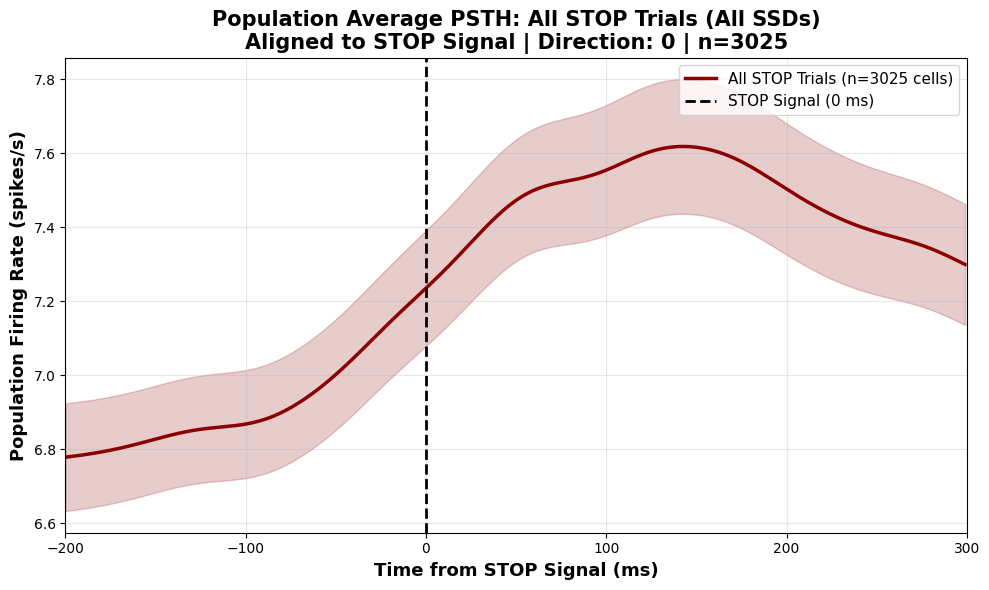

In [49]:
# Plot PSTH of ALL STOP trials (across all SSDs) aligned to STOP Signal

def plot_all_stop_trials_aligned_to_stop():
    # Define strict parameters for this plot
    plot_window_stop = [-200, 300]
    bin_size_stop = 1
    smooth_psth = True

    all_stop_rates = []
    valid_cell_count = 0
    time_axis_stop_all = None
    
    # Ensure variables are available
    if 'session' not in globals() or 'DIRECTION' not in globals():
        print("Required variables (session, DIRECTION) are not defined.")
        return

    print(f"Aggregating all STOP trials (combining SSDs) for Direction {DIRECTION}...")
    dir_label = dir_map[DIRECTION] if 'dir_map' in locals() else str(DIRECTION)

    # Use tqdm if available, otherwise just iterate
    try:
        from tqdm import tqdm
        iterator = tqdm(session.cell_ids)
    except ImportError:
        iterator = session.cell_ids

    for cell_id in iterator:
        # Get cell data
        cell_data = session.get_cell_data(cell_id)
        if cell_data.empty:
            continue
            
        cell = Cell(cell_data, verbose=False)
        
        # Calculate PSTH aligned to STOP cue
        # trial_type='STOP' and ssd_number=None (implies all SSDs)
        # alignment_point='stop_cue'
        t, fr, n = cell.calculate_psth(
            epok=plot_window_stop,
            bin_size=bin_size_stop,
            alignment_point='stop_cue',
            trial_type='STOP',
            direction=DIRECTION,
            ssd_number=None,  # Combine all SSDs
            success_only=True,
            smooth=smooth_psth,
            smooth_ker_size=25
        )
        
        if t is not None and n > 0:
            all_stop_rates.append(fr)
            valid_cell_count += 1
            # Store time axis from first valid cell
            if time_axis_stop_all is None:
                time_axis_stop_all = t

    if all_stop_rates:
        # Compute population statistics
        stop_matrix = np.vstack(all_stop_rates)
        stop_mean_all = np.nanmean(stop_matrix, axis=0)
        stop_sem_all = np.nanstd(stop_matrix, axis=0) / np.sqrt(valid_cell_count)
        
        # Plot
        plt.figure(figsize=(10, 6))
        
        if time_axis_stop_all is not None:
             plt.plot(time_axis_stop_all, stop_mean_all, color='darkred', label=f'All STOP Trials (n={valid_cell_count} cells)', linewidth=2.5)
             plt.fill_between(time_axis_stop_all, stop_mean_all - stop_sem_all, stop_mean_all + stop_sem_all, 
                         color='darkred', alpha=0.2)
        
        plt.axvline(0, color='black', linestyle='--', linewidth=2, label='STOP Signal (0 ms)')
        
        plt.xlabel('Time from STOP Signal (ms)', fontsize=13, fontweight='bold')
        plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
        plt.title(f'Population Average PSTH: All STOP Trials (All SSDs)\nAligned to STOP Signal | Direction: {dir_label} | n={valid_cell_count}', 
                  fontsize=15, fontweight='bold')
        plt.legend(loc='upper right', fontsize=11)
        plt.grid(alpha=0.3)
        plt.xlim(plot_window_stop[0], plot_window_stop[1])
        
        plt.tight_layout()
        plt.show()
    else:
        print("No valid STOP trials found across all SSDs.")

plot_all_stop_trials_aligned_to_stop()


Calculating aggregate STOP trials PSTH (Real STOP)...

Calculating mean SSD values for Virtual STOP alignment...
SSD 1: 49.66 ms
SSD 2: 109.22 ms
SSD 3: 168.43 ms
SSD 4: 227.78 ms
Processing GO trials for SSD 1 (mean = 50 ms)...
Processing GO trials for SSD 2 (mean = 109 ms)...
Processing GO trials for SSD 3 (mean = 168 ms)...
Processing GO trials for SSD 4 (mean = 228 ms)...


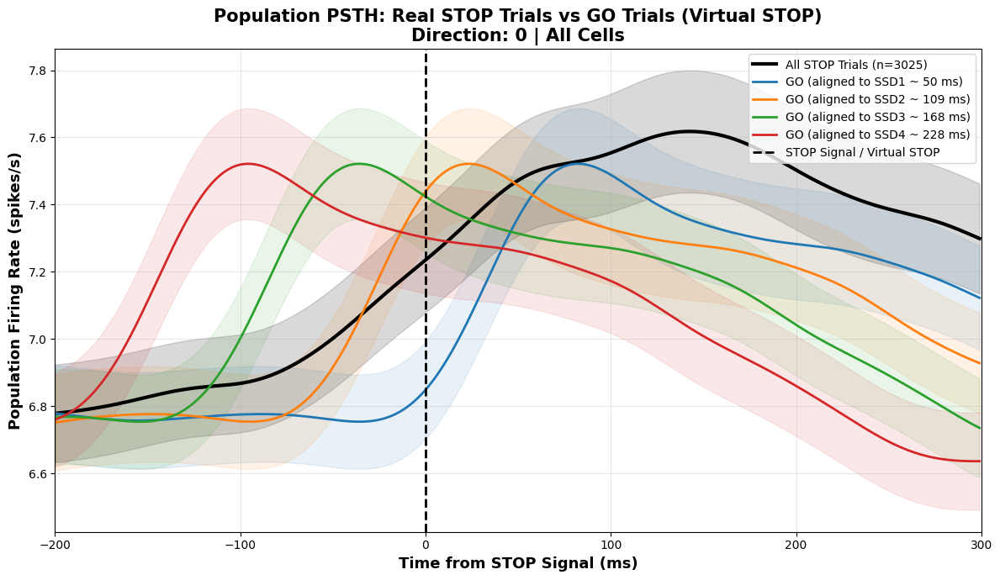

In [50]:
# Plot Population PSTH: Real STOP Trials vs GO Trials Aligned to Mean SSD (Virtual STOP)
# ============================================================================

def plot_go_aligned_to_mean_ssds_with_stop():
    # Parameters
    plot_window = [-200, 300]
    bin_size = 1
    smooth_psth = True
    ssd_colors = {1: '#1f77b4', 2: '#ff7f0e', 3: '#2ca02c', 4: '#d62728'}  # Blue, Orange, Green, Red
    
    plt.figure(figsize=(12, 7))

    # --- Part 1: STOP Trials (All SSDs) ---
    print("Calculating aggregate STOP trials PSTH (Real STOP)...")
    all_stop_rates = []
    valid_stop_count = 0
    time_axis_stop = None
    
    # Use session.cell_ids to iterate
    cell_ids_to_process = session.cell_ids
    
    for cell_id in cell_ids_to_process:
        cell_data = session.get_cell_data(cell_id)
        if cell_data.empty: continue
        
        cell = Cell(cell_data, verbose=False)
        t, fr, n = cell.calculate_psth(
            epok=plot_window,
            bin_size=bin_size,
            alignment_point='stop_cue',
            trial_type='STOP',
            direction=DIRECTION,
            ssd_number=None, # All SSDs
            success_only=True,
            smooth=smooth_psth,
            smooth_ker_size=25
        )
        if t is not None and n > 0:
            all_stop_rates.append(fr)
            valid_stop_count += 1
            if time_axis_stop is None: time_axis_stop = t

    if all_stop_rates:
        stop_matrix = np.vstack(all_stop_rates)
        stop_mean = np.nanmean(stop_matrix, axis=0)
        stop_sem = np.nanstd(stop_matrix, axis=0) / np.sqrt(valid_stop_count)
        
        if time_axis_stop is not None:
             plt.plot(time_axis_stop, stop_mean, color='black', label=f'All STOP Trials (n={valid_stop_count})', linewidth=3)
             plt.fill_between(time_axis_stop, stop_mean - stop_sem, stop_mean + stop_sem, 
                         color='black', alpha=0.15)
    else:
        print("No valid STOP trials found.")


    # --- Part 2: GO Trials Aligned to Mean SSD ---
    print("\nCalculating mean SSD values for Virtual STOP alignment...")
    mean_ssds = {}
    for ssd in [1, 2, 3, 4]:
        subset = session.data[
            (session.data['type'] == 'STOP') & 
            (session.data['dir'] == DIRECTION) &
            (session.data['ssd_number'] == ssd) &
            (session.data['trial_failed'] == False)
        ]
        if not subset.empty:
            mean_ssds[ssd] = subset['ssd_len'].mean()
            print(f"SSD {ssd}: {mean_ssds[ssd]:.2f} ms")
    
    iterator_items = list(mean_ssds.items())
    
    for ssd_num, mean_val in iterator_items:
        bias = int(round(mean_val))
        if bias <= 0: continue
            
        print(f"Processing GO trials for SSD {ssd_num} (mean = {bias} ms)...")
        all_rates = []
        valid_count = 0
        time_axis = None
        
        for cell_id in cell_ids_to_process:
            cell_data = session.get_cell_data(cell_id)
            if cell_data.empty: continue
            
            try:
                temp_cell = Cell(cell_data, verbose=False, go_trials_stop_cue_alignment_bias=bias)
                t, fr, n = temp_cell.calculate_psth(
                    epok=plot_window,
                    bin_size=bin_size,
                    alignment_point='stop_cue', # This triggers the bias logic for GO trials
                    trial_type='GO',
                    direction=DIRECTION,
                    success_only=True,
                    smooth=smooth_psth,
                    smooth_ker_size=25
                )
                if t is not None and n > 0:
                    all_rates.append(fr)
                    valid_count += 1
                    if time_axis is None: time_axis = t
            except Exception: continue
        
        if all_rates:
            rate_matrix = np.vstack(all_rates)
            mean_rate = np.nanmean(rate_matrix, axis=0)
            sem_rate = np.nanstd(rate_matrix, axis=0) / np.sqrt(valid_count)
            
            if time_axis is not None:
                color = ssd_colors.get(ssd_num, 'gray')
                label = f'GO (aligned to SSD{ssd_num} ~ {bias} ms)'
                plt.plot(time_axis, mean_rate, color=color, label=label, linewidth=2)
                plt.fill_between(time_axis, mean_rate - sem_rate, mean_rate + sem_rate, 
                                color=color, alpha=0.1)

    # Finalize
    dir_label = dir_map[DIRECTION] if 'dir_map' in locals() else str(DIRECTION)
    plt.axvline(0, color='black', linestyle='--', linewidth=2, label='STOP Signal / Virtual STOP')
    
    plt.xlabel('Time from STOP Signal (ms)', fontsize=13, fontweight='bold')
    plt.ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
    plt.title(f'Population PSTH: Real STOP Trials vs GO Trials (Virtual STOP)\nDirection: {dir_label} | All Cells', 
              fontsize=15, fontweight='bold')
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(alpha=0.3)
    plt.xlim(plot_window[0], plot_window[1])
    
    plt.tight_layout()
    plt.show()

plot_go_aligned_to_mean_ssds_with_stop()


In [51]:
# import panel as pn
# pn.extension()

# class SSDDivergenceDashboard:
#     SMOOTH_KER_SIZE = 15
#     def __init__(self, session, direction, bin_size=1, window=[-200, 300]):
#         self.session = session
#         self.direction = direction
#         self.bin_size = bin_size
#         self.window = window
#         self.ssd_colors = {1: '#1f77b4', 2: '#ff7f0e', 3: '#2ca02c', 4: '#d62728'}
        
#         # Placeholders for data
#         self.stop_data = None # (time, mean, sem, n)
#         self.go_data = {}     # ssd_num -> (time, mean, sem, n, bias_val)
        
#         # Pre-calculate on init
#         self._precalculate_all()
        
#     def _precalculate_all(self):
#         print("Pre-calculating data for dashboard...")
        
#         # --- 1. STOP Trials (Aggregate) ---
#         print("  Processing STOP trials...")
#         all_stop_rates = []
#         time_axis_stop = None
#         valid_stop_count = 0
        
#         cell_ids = self.session.cell_ids
#         for cell_id in cell_ids:
#             cell_data = self.session.get_cell_data(cell_id)
#             if cell_data.empty: continue
            
#             cell = Cell(cell_data, verbose=False)
#             t, fr, n = cell.calculate_psth(
#                 epok=self.window, bin_size=self.bin_size,
#                 alignment_point='stop_cue', trial_type='STOP',
#                 direction=self.direction, ssd_number=None, success_only=True,
#                 smooth=True, smooth_ker_size=self.SMOOTH_KER_SIZE
#             )
#             if t is not None and n > 0:
#                 all_stop_rates.append(fr)
#                 valid_stop_count += 1
#                 if time_axis_stop is None: time_axis_stop = t
                
#         if all_stop_rates:
#             mat = np.vstack(all_stop_rates)
#             self.stop_data = (
#                 time_axis_stop, 
#                 np.nanmean(mat, axis=0), 
#                 np.nanstd(mat, axis=0) / np.sqrt(valid_stop_count),
#                 valid_stop_count
#             )
            
#         # --- 2. GO Trials (Per SSD) ---
#         print("  Processing GO trials for each SSD...")
#         # First find mean SSDs
#         mean_ssds = {}
#         for ssd in [1, 2, 3, 4]:
#             subset = self.session.data[
#                 (self.session.data['type'] == 'STOP') & 
#                 (self.session.data['dir'] == self.direction) &
#                 (self.session.data['ssd_number'] == ssd) &
#                 (self.session.data['trial_failed'] == False)
#             ]
#             if not subset.empty:
#                 mean_ssds[ssd] = subset['ssd_len'].mean()
        
#         # Calculate PSTHs
#         for ssd_num, mean_val in mean_ssds.items():
#             bias = int(round(mean_val))
#             if bias <= 0: continue
            
#             all_go_rates = []
#             valid_go_count = 0
#             time_axis_go = None
            
#             for cell_id in cell_ids:
#                 cell_data = self.session.get_cell_data(cell_id)
#                 if cell_data.empty: continue
                
#                 try:
#                     # Virtual GO alignment
#                     temp_cell = Cell(cell_data, verbose=False, go_trials_stop_cue_alignment_bias=bias)
#                     t, fr, n = temp_cell.calculate_psth(
#                         epok=self.window, bin_size=self.bin_size,
#                         alignment_point='stop_cue', trial_type='GO',
#                         direction=self.direction, success_only=True,
#                         smooth=True, smooth_ker_size=SMOOTH_KER_SIZE
#                     )
#                     if t is not None and n > 0:
#                         all_go_rates.append(fr)
#                         valid_go_count += 1
#                         if time_axis_go is None: time_axis_go = t
#                 except: continue
            
#             if all_go_rates:
#                 mat = np.vstack(all_go_rates)
#                 self.go_data[ssd_num] = (
#                     time_axis_go,
#                     np.nanmean(mat, axis=0),
#                     np.nanstd(mat, axis=0) / np.sqrt(valid_go_count),
#                     valid_go_count,
#                     bias
#                 )
#         print("Done.")

#     def plot(self, selected_ssds):
#         # Allow passing single int or list
#         if isinstance(selected_ssds, int):
#             selected_ssds = [selected_ssds]
            
#         # Increased figure size to fit screen
#         fig, ax = plt.subplots(figsize=(16, 7))
        
#         # Plot STOP (Reference)
#         if self.stop_data is not None:
#             t, m, s, n = self.stop_data
#             ax.plot(t, m, color='black', linewidth=3, label=f'Real STOP Trials (n={n})')
#             ax.fill_between(t, m-s, m+s, color='black', alpha=0.15)
            
#         # Plot Selected GO SSDs
#         for ssd in selected_ssds:
#             if ssd in self.go_data:
#                 t, m, s, n, bias = self.go_data[ssd]
#                 c = self.ssd_colors.get(ssd, 'gray')
#                 label = f'GO: Virtual STOP SSD{ssd} ({bias} ms)'
#                 ax.plot(t, m, color=c, linewidth=2, label=label)
#                 ax.fill_between(t, m-s, m+s, color=c, alpha=0.1)
                
#         # Styling
#         dir_label = dir_map[self.direction] if 'dir_map' in globals() else str(self.direction)
#         ax.set_xlabel('Time from STOP Signal (ms)', fontsize=13, fontweight='bold')
#         ax.set_ylabel('Population Firing Rate (spikes/s)', fontsize=13, fontweight='bold')
#         ax.set_title(f'Trajectory Divergence Dashboard\nDirection: {dir_label} | All Cells | Window: {self.window}', 
#                      fontsize=15, fontweight='bold')
#         ax.axvline(0, color='black', linestyle='--', label='STOP Signal')
#         ax.legend(loc='upper right', fontsize=11)
#         ax.grid(alpha=0.3)
#         ax.set_xlim(self.window)
#         plt.close(fig) # Prevent double display
#         return fig

# # Initialize Dashboard Logic (calculates data once)
# div_dash = SSDDivergenceDashboard(session, DIRECTION, bin_size=1, window=[-200, 300])

# # Create Widgets
# available_ssds = sorted(div_dash.go_data.keys())
# ssd_selector = pn.widgets.CheckButtonGroup(
#     name='Select SSDs', 
#     value=[available_ssds[0]] if available_ssds else [], 
#     options=available_ssds,
#     button_type='primary'
# )

# @pn.depends(ssd_selector)
# def update_divergence_plot(selected):
#     if not selected:
#         return "Please select at least one SSD."
#     # Wrap in Matplotlib pane to ensure responsiveness
#     return pn.pane.Matplotlib(div_dash.plot(selected), sizing_mode='stretch_width', tight=True)

# # Layout
# dashboard_layout = pn.Column(
#     pn.pane.Markdown("### Interactive Population Divergence"),
#     pn.Row(pn.pane.Markdown("**Toggle SSDs to compare against Real STOP trials:**"), ssd_selector),
#     update_divergence_plot,
#     sizing_mode='stretch_width'
# )

# dashboard_layout.servable()
